# Lib1 Barcode-Count Training Evaluation (May 13, 2026)

This notebook focuses only on the training barcode-count question: at equal construct count, how do coarse barcode ranges and exact low-barcode bins behave? It compares `branched_only` and `full` unfreeze scopes for the May follow-up `loggrid` and `exact_low` runs without rewriting any combined CSVs.

Use `SCOPES_TO_PLOT` near the top to limit plots to one scope, e.g. `["full"]`, when you want a lighter rerun.

In [1]:
from __future__ import annotations

import json
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns
try:
    from IPython.display import display, Markdown
except ModuleNotFoundError:
    def display(obj=None, *args, **kwargs):
        print(obj)

    class Markdown(str):
        pass

pd.set_option("display.max_columns", 220)
pd.set_option("display.max_rows", 140)
pd.set_option("display.width", 240)

sns.set_theme(context="notebook", style="whitegrid", palette="colorblind")
plt.rcParams["figure.dpi"] = 120

REPO_ROOT = Path("/home/minhang/synBio_AL/boda2_EU")
LC_ROOT = REPO_ROOT / "src/finetune/learning_curve"

RUN_SPECS = {
    "original_comparable": {
        "label": "Original comparable-bin B2/B3 reference",
        "kind": "barcode",
        "dir_name": "lib1_enhancer_barcode_range_comparable_bins_hq4_hq8_b2_b3_bcap10_30_seed5_may2026",
    },
    "loggrid": {
        "label": "Comparable-bin log-grid B1/B2",
        "kind": "barcode",
        "dir_name": "lib1_enhancer_barcode_range_comparable_bins_loggrid_hq4_hq8_cap1000_b1_b2_may2026",
        "extra_dir_names": [
            "lib1_enhancer_barcode_range_comparable_bins_loggrid_hq4_hq8_cap1000_b1_b2_full_may2026",
        ],
    },
    "exact_low": {
        "label": "Exact-low barcode B1/B2",
        "kind": "barcode",
        "dir_name": "lib1_enhancer_exact_low_barcode_hq4_hq8_cap500_b1_b2_may2026",
        "extra_dir_names": [
            "lib1_enhancer_exact_low_barcode_hq4_hq8_cap500_b1_b2_full_may2026",
        ],
    },
}

UNFREEZE_SCOPE_ORDER = ["branched_only", "full"]
# Edit this list if you only want one scope's plots, e.g. ["full"].
SCOPES_TO_PLOT = ["branched_only", "full"]
DEFAULT_UNFREEZE_SCOPE = "branched_only"

SPLIT_ORDER = ["train", "val", "test"]

METRIC_SPECS = {
    "cod_r2": {
        "label": "COD R2",
        "higher_is_better": True,
        "cols": {"train": "train_r2_cod", "val": "val_r2_cod", "test": "test_r2_cod"},
        "margin": 0.02,
    },
    "pearson": {
        "label": "Pearson r",
        "higher_is_better": True,
        "cols": {"train": "train_pearson", "val": "val_pearson", "test": "test_pearson"},
        "margin": 0.02,
    },
    "spearman": {
        "label": "Spearman rho",
        "higher_is_better": True,
        "cols": {"train": "train_spearman", "val": "val_spearman", "test": "test_spearman"},
        "margin": 0.02,
    },
    "loss": {
        "label": "MSE loss, std target",
        "higher_is_better": False,
        "cols": {
            "train": "train_loss_standardized",
            "val": "val_loss_standardized",
            "test": "test_loss_standardized",
        },
        "margin": 0.02,
    },
}
METRIC_ROOTS = tuple(METRIC_SPECS)
METRIC_LABEL_ORDER = [METRIC_SPECS[m]["label"] for m in METRIC_ROOTS]
ERROR_BAND_ALPHA = 0.13

RANGE_BIN_LABEL_ORDER = ["1-3 barcodes", "4-6 barcodes", ">=7 barcodes"]
EXACT_BIN_LABEL_ORDER = ["1 barcode", "2 barcodes", "3 barcodes", "4-6 barcodes", ">=7 barcodes"]
QUALITY_LABEL_ORDER = [
    "test: 1-2 barcodes",
    "test: 3-4 barcodes",
    "test: 5-6 barcodes",
    "test: 7-8 barcodes",
    "test: >=9 barcodes",
]

RANGE_BIN_PALETTE = {
    "1-3 barcodes": "#0072B2",
    "4-6 barcodes": "#D55E00",
    ">=7 barcodes": "#5D3A9B",
}
EXACT_BIN_PALETTE = {
    "1 barcode": "#0072B2",
    "2 barcodes": "#56B4E9",
    "3 barcodes": "#009E73",
    "4-6 barcodes": "#D55E00",
    ">=7 barcodes": "#5D3A9B",
}
QUALITY_PALETTE = dict(zip(QUALITY_LABEL_ORDER, sns.color_palette("colorblind", len(QUALITY_LABEL_ORDER))))
SPLIT_PALETTE = {"train": "#0072B2", "val": "#E69F00", "test": "#CC79A7"}

## Load combined outputs

These cells read the combined CSVs and append matching `full` and `branched_only` output directories in memory. Split plans and zero-shot baseline tables are kept from the primary directory because they do not depend on unfreeze scope.

In [2]:
def read_csv_required(path: Path) -> pd.DataFrame:
    if not path.exists():
        raise FileNotFoundError(path)
    return pd.read_csv(path)


def read_json_required(path: Path) -> dict:
    if not path.exists():
        raise FileNotFoundError(path)
    with path.open() as handle:
        return json.load(handle)


def annotate_bundle_frame(frame: pd.DataFrame, *, key: str, label: str, run_dir: Path | None = None) -> pd.DataFrame:
    out = frame.copy()
    out["run_key"] = key
    out["run_label"] = label
    if run_dir is not None:
        out["result_dir_name"] = run_dir.name
    return out


def load_run_bundle(key: str, spec: dict) -> dict:
    dir_names = [spec["dir_name"], *spec.get("extra_dir_names", [])]
    run_dirs = [LC_ROOT / dir_name for dir_name in dir_names]
    combined_dirs = [run_dir / "combined" for run_dir in run_dirs]

    run_parts = []
    history_parts = []
    manifests = []
    planned = None
    zero_shot = None
    for run_dir, combined_dir in zip(run_dirs, combined_dirs):
        run_parts.append(
            annotate_bundle_frame(
                read_csv_required(combined_dir / "learning_curve_runs.csv"),
                key=key,
                label=spec["label"],
                run_dir=run_dir,
            )
        )
        history_parts.append(
            annotate_bundle_frame(
                read_csv_required(combined_dir / "learning_curve_histories.csv"),
                key=key,
                label=spec["label"],
                run_dir=run_dir,
            )
        )
        manifests.append(read_json_required(combined_dir / "run_manifest_combined.json"))

        # Split plans and zero-shot baselines do not depend on unfreeze scope.
        # Keep the primary run's copy to avoid duplicate rows after appending full-scope outputs.
        if planned is None:
            barcode_grid_path = combined_dir / "barcode_range_planned_grid.csv"
            quality_grid_path = combined_dir / "quality_split_planned_grid.csv"
            if barcode_grid_path.exists():
                planned = annotate_bundle_frame(read_csv_required(barcode_grid_path), key=key, label=spec["label"])
            if quality_grid_path.exists():
                planned = annotate_bundle_frame(read_csv_required(quality_grid_path), key=key, label=spec["label"])
        if zero_shot is None:
            zero_shot_path = combined_dir / "zero_shot_evaluations.csv"
            if zero_shot_path.exists():
                zero_shot = annotate_bundle_frame(read_csv_required(zero_shot_path), key=key, label=spec["label"])

    return {
        "key": key,
        "label": spec["label"],
        "kind": spec["kind"],
        "run_dir": run_dirs[0],
        "run_dirs": run_dirs,
        "combined_dir": combined_dirs[0],
        "combined_dirs": combined_dirs,
        "runs": pd.concat(run_parts, ignore_index=True),
        "histories": pd.concat(history_parts, ignore_index=True),
        "manifest": manifests[0],
        "manifests": manifests,
        "planned": planned,
        "zero_shot": zero_shot,
    }


bundles = {key: load_run_bundle(key, spec) for key, spec in RUN_SPECS.items()}

for key, bundle in bundles.items():
    print(f"{key}:")
    print("  outputs:")
    for run_dir in bundle["run_dirs"]:
        print(f"    - {run_dir}")
    print(f"  runs: {bundle['runs'].shape}")
    print(f"  histories: {bundle['histories'].shape}")
    if "unfreeze_scope" in bundle["runs"].columns:
        print(f"  scopes: {sorted(bundle['runs']['unfreeze_scope'].dropna().unique())}")
    if isinstance(bundle["planned"], pd.DataFrame):
        print(f"  planned grid: {bundle['planned'].shape}")
    print()

original_comparable:
  outputs:
    - /home/minhang/synBio_AL/boda2_EU/src/finetune/learning_curve/lib1_enhancer_barcode_range_comparable_bins_hq4_hq8_b2_b3_bcap10_30_seed5_may2026
  runs: (720, 131)
  histories: (26478, 71)
  scopes: ['branched_only', 'full']
  planned grid: (30, 33)

loggrid:
  outputs:
    - /home/minhang/synBio_AL/boda2_EU/src/finetune/learning_curve/lib1_enhancer_barcode_range_comparable_bins_loggrid_hq4_hq8_cap1000_b1_b2_may2026
    - /home/minhang/synBio_AL/boda2_EU/src/finetune/learning_curve/lib1_enhancer_barcode_range_comparable_bins_loggrid_hq4_hq8_cap1000_b1_b2_full_may2026
  runs: (504, 131)
  histories: (14552, 71)
  scopes: ['branched_only', 'full']
  planned grid: (18, 33)

exact_low:
  outputs:
    - /home/minhang/synBio_AL/boda2_EU/src/finetune/learning_curve/lib1_enhancer_exact_low_barcode_hq4_hq8_cap500_b1_b2_may2026
    - /home/minhang/synBio_AL/boda2_EU/src/finetune/learning_curve/lib1_enhancer_exact_low_barcode_hq4_hq8_cap500_b1_b2_full_may2026
 

## Run Grid Sanity Check

Before reading curves, confirm that the barcode-training runs are paired on seeds, settings, heads, train sizes, heldout thresholds, and unfreeze scopes. The `loggrid` run is the low-N overview; `exact_low` isolates barcode=1, 2, and 3.

In [3]:
def compact_values(series, max_items=14, precision=4) -> str:
    values = pd.Series(series).dropna()
    if values.empty:
        return ""
    values = values.drop_duplicates()
    try:
        values = values.sort_values()
    except TypeError:
        pass
    out = []
    for value in values.iloc[:max_items]:
        if isinstance(value, float):
            out.append(f"{value:.{precision}g}")
        else:
            out.append(str(value))
    if len(values) > max_items:
        out.append(f"... +{len(values) - max_items}")
    return ", ".join(out)


def model_fit_count(frame: pd.DataFrame) -> int:
    id_cols = [
        "source_seed_dir",
        "seed",
        "heldout_min_barcodes",
        "setting",
        "init_head",
        "unfreeze_scope",
        "train_barcode_bin",
        "train_size",
        "head_lr",
        "backbone_lr",
    ]
    id_cols = [col for col in id_cols if col in frame.columns]
    if not id_cols:
        return len(frame)
    return len(frame.drop_duplicates(id_cols))


def manifest_example(bundle: dict) -> dict:
    return bundle["manifest"].get("example_manifest", {})


def summarize_bundle(bundle: dict) -> dict:
    runs = bundle["runs"]
    hist = bundle["histories"]
    planned = bundle["planned"]
    ex = manifest_example(bundle)
    row = {
        "run": bundle["label"],
        "kind": bundle["kind"],
        "combined rows": len(runs),
        "model fits": model_fit_count(runs),
        "seeds": compact_values(runs["seed"]) if "seed" in runs else "",
        "settings": compact_values(runs["setting"]) if "setting" in runs else "",
        "heldout min bc": compact_values(runs["heldout_min_barcodes"]) if "heldout_min_barcodes" in runs else "",
        "val min bc": compact_values(runs["val_min_barcodes"]) if "val_min_barcodes" in runs else ex.get("val_min_barcodes", ""),
        "train bins": compact_values(runs["train_barcode_bin_label"]) if "train_barcode_bin_label" in runs else "",
        "test quality bins": compact_values(runs["test_quality_bin_label"]) if "test_quality_bin_label" in runs else "",
        "train sizes": compact_values(runs["train_size"]) if "train_size" in runs else "",
        "train fractions": compact_values(runs["train_fraction"], precision=3) if "train_fraction" in runs else "",
        "train pool cap": ex.get("train_pool_cap", compact_values(runs["train_pool_cap"]) if "train_pool_cap" in runs else ""),
        "unfreeze scopes": compact_values(runs["unfreeze_scope"]) if "unfreeze_scope" in runs else "",
        "heads": compact_values(runs["init_head"]) if "init_head" in runs else "",
        "max logged epoch": int(hist["epoch"].max()) if "epoch" in hist and len(hist) else "",
        "max_epochs arg": ex.get("max_epochs", ""),
        "patience": ex.get("patience", ""),
    }
    if isinstance(planned, pd.DataFrame):
        if "test_n_per_quality" in planned:
            row["test n per quality"] = compact_values(planned["test_n_per_quality"])
        if "test_size_raw" in planned:
            row["planned test size"] = compact_values(planned["test_size_raw"])
        if "val_size_raw" in planned:
            row["planned val size"] = compact_values(planned["val_size_raw"])
    return row


hyperparam_summary = pd.DataFrame([summarize_bundle(bundle) for bundle in bundles.values()])
display(hyperparam_summary)

,run,kind,combined rows,model fits,seeds,settings,heldout min bc,val min bc,train bins,test quality bins,train sizes,train fractions,train pool cap,unfreeze scopes,heads,max logged epoch,max_epochs arg,patience,planned test size,planned val size
0,Original comparable-bin B2/B3 reference,barcode,720,720,"19, 23, 31, 37, 43","B2_with_RC, B3_with_RC_weighted_bcap_10, B3_wi...","4, 8",,"1-3 barcodes, 4-6 barcodes, >=7 barcodes",,"250, 500, 750, 1000","0.25, 0.5, 0.75, 1",,"branched_only, full",K562,89,90,20,"123, 294","123, 294"
1,Comparable-bin log-grid B1/B2,barcode,504,504,"19, 23, 31","B1_no_RC, B2_with_RC","4, 8",,"1-3 barcodes, 4-6 barcodes, >=7 barcodes",,"10, 20, 50, 100, 200, 500, 1000","0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1",,"branched_only, full",K562,69,70,10,"123, 294","123, 294"
2,Exact-low barcode B1/B2,barcode,720,720,"19, 23, 31","B1_no_RC, B2_with_RC","4, 8",,"1 barcode, 2 barcodes, 3 barcodes, 4-6 barcode...",,"10, 25, 50, 100, 250, 500","0.02, 0.05, 0.1, 0.2, 0.5, 1",,"branched_only, full",K562,69,70,10,"123, 294","123, 294"


In [4]:
def grid_count_table(bundle: dict) -> pd.DataFrame:
    runs = bundle["runs"]
    group_cols = [
        col
        for col in [
            "heldout_min_barcodes",
            "setting",
            "unfreeze_scope",
            "init_head",
            "train_barcode_bin_label",
            "test_quality_bin_label",
            "train_size",
        ]
        if col in runs.columns
    ]
    return (
        runs.groupby(group_cols, dropna=False, observed=True)
        .size()
        .reset_index(name="rows")
        .sort_values(group_cols)
    )


for key in ["original_comparable", "loggrid", "exact_low"]:
    display(Markdown(f"### {bundles[key]['label']} grid counts"))
    display(grid_count_table(bundles[key]).head(80))

### Original comparable-bin B2/B3 reference grid counts

,heldout_min_barcodes,setting,unfreeze_scope,init_head,train_barcode_bin_label,train_size,rows
0,4,B2_with_RC,branched_only,K562,1-3 barcodes,250,5
1,4,B2_with_RC,branched_only,K562,1-3 barcodes,500,5
2,4,B2_with_RC,branched_only,K562,1-3 barcodes,750,5
3,4,B2_with_RC,branched_only,K562,1-3 barcodes,1000,5
4,4,B2_with_RC,branched_only,K562,4-6 barcodes,250,5
5,4,B2_with_RC,branched_only,K562,4-6 barcodes,500,5
6,4,B2_with_RC,branched_only,K562,4-6 barcodes,750,5
7,4,B2_with_RC,branched_only,K562,4-6 barcodes,1000,5
8,4,B2_with_RC,branched_only,K562,>=7 barcodes,250,5
9,4,B2_with_RC,branched_only,K562,>=7 barcodes,500,5


### Comparable-bin log-grid B1/B2 grid counts

,heldout_min_barcodes,setting,unfreeze_scope,init_head,train_barcode_bin_label,train_size,rows
0,4,B1_no_RC,branched_only,K562,1-3 barcodes,10,3
1,4,B1_no_RC,branched_only,K562,1-3 barcodes,20,3
2,4,B1_no_RC,branched_only,K562,1-3 barcodes,50,3
3,4,B1_no_RC,branched_only,K562,1-3 barcodes,100,3
4,4,B1_no_RC,branched_only,K562,1-3 barcodes,200,3
5,4,B1_no_RC,branched_only,K562,1-3 barcodes,500,3
6,4,B1_no_RC,branched_only,K562,1-3 barcodes,1000,3
7,4,B1_no_RC,branched_only,K562,4-6 barcodes,10,3
8,4,B1_no_RC,branched_only,K562,4-6 barcodes,20,3
9,4,B1_no_RC,branched_only,K562,4-6 barcodes,50,3


### Exact-low barcode B1/B2 grid counts

,heldout_min_barcodes,setting,unfreeze_scope,init_head,train_barcode_bin_label,train_size,rows
0,4,B1_no_RC,branched_only,K562,1 barcode,10,3
1,4,B1_no_RC,branched_only,K562,1 barcode,25,3
2,4,B1_no_RC,branched_only,K562,1 barcode,50,3
3,4,B1_no_RC,branched_only,K562,1 barcode,100,3
4,4,B1_no_RC,branched_only,K562,1 barcode,250,3
5,4,B1_no_RC,branched_only,K562,1 barcode,500,3
6,4,B1_no_RC,branched_only,K562,2 barcodes,10,3
7,4,B1_no_RC,branched_only,K562,2 barcodes,25,3
8,4,B1_no_RC,branched_only,K562,2 barcodes,50,3
9,4,B1_no_RC,branched_only,K562,2 barcodes,100,3


## Shared metric helpers

The plotting helpers convert each wide run table into one row per metric/split. The loss shown here is standardized-target MSE, so loss comparisons are clean within a run/split but should be interpreted cautiously across very different held-out quality distributions.

In [5]:
HELDOUT_SPLIT_SIZE_LOOKUP = {
    4: {"val": 294, "test": 294},
    8: {"val": 123, "test": 123},
}


def compact_int_values(values) -> str:
    numeric = pd.to_numeric(pd.Series(values), errors="coerce").dropna().astype(int).unique()
    return ", ".join(map(str, sorted(numeric)))


def barcode_split_size_label(frame: pd.DataFrame | None, *, heldout_min=None) -> str:
    val_n = test_n = ""
    if frame is not None and not frame.empty:
        df = frame.copy()
        if heldout_min is not None and "heldout_min_barcodes" in df.columns:
            df = df[df["heldout_min_barcodes"] == heldout_min]
        if "val_size_raw" in df.columns:
            val_n = compact_int_values(df["val_size_raw"])
        if "test_size_raw" in df.columns:
            test_n = compact_int_values(df["test_size_raw"])
    if (not val_n or not test_n) and heldout_min in HELDOUT_SPLIT_SIZE_LOOKUP:
        sizes = HELDOUT_SPLIT_SIZE_LOOKUP[int(heldout_min)]
        val_n = val_n or str(sizes["val"])
        test_n = test_n or str(sizes["test"])
    parts = []
    if val_n:
        parts.append(f"val n={val_n}")
    if test_n:
        parts.append(f"test n={test_n}")
    return "; ".join(parts)


def random_quality_split_size_label(planned: pd.DataFrame | None) -> str:
    if planned is None or planned.empty:
        return "val n=250; combined test n=1000; per-bin test n=200"
    parts = []
    if "val_size_raw" in planned.columns:
        parts.append(f"val n={compact_int_values(planned['val_size_raw'])}")
    if "test_size_raw" in planned.columns:
        parts.append(f"combined test n={compact_int_values(planned['test_size_raw'])}")
    if "test_n_per_quality" in planned.columns:
        parts.append(f"per-bin test n={compact_int_values(planned['test_n_per_quality'])}")
    return "; ".join(parts) if parts else "val n=250; combined test n=1000; per-bin test n=200"


def append_title_context(title: str, context: str | None) -> str:
    return f"{title}; {context}" if context else title


def metric_column(split: str, metric_root: str) -> str:
    return METRIC_SPECS[metric_root]["cols"][split]


def infer_bin_order(labels) -> list[str]:
    label_set = set(pd.Series(labels).dropna().astype(str))
    if label_set.issubset(set(EXACT_BIN_LABEL_ORDER)):
        return [label for label in EXACT_BIN_LABEL_ORDER if label in label_set]
    if label_set.issubset(set(RANGE_BIN_LABEL_ORDER)):
        return [label for label in RANGE_BIN_LABEL_ORDER if label in label_set]
    if label_set.issubset(set(QUALITY_LABEL_ORDER)):
        return [label for label in QUALITY_LABEL_ORDER if label in label_set]
    return sorted(label_set)


def make_metric_long(
    frame: pd.DataFrame,
    metric_roots=METRIC_ROOTS,
    split_values=SPLIT_ORDER,
) -> pd.DataFrame:
    rows = []
    id_cols = [
        "run_key",
        "run_label",
        "run_id",
        "seed",
        "heldout_min_barcodes",
        "split_strategy",
        "split_seed_effective",
        "val_seed_effective",
        "test_seed_effective",
        "train_barcode_bin",
        "train_barcode_bin_label",
        "train_barcode_bin_sort_order",
        "train_sampling_mode",
        "setting",
        "init_head",
        "unfreeze_scope",
        "train_size",
        "train_fraction",
        "train_pool_eligible_size",
        "train_pool_cap",
        "train_rest_size",
        "val_size_raw",
        "test_size_raw",
        "train_barcode_mean",
        "train_barcode_median",
        "train_hq_fraction",
        "target_scaler_mean",
        "target_scaler_std",
        "best_epoch",
        "test_quality_bin",
        "test_quality_bin_label",
        "test_quality_bin_sort_order",
        "test_n_per_quality",
    ]
    id_cols = [col for col in id_cols if col in frame.columns]
    for metric_root in metric_roots:
        spec = METRIC_SPECS[metric_root]
        for split in split_values:
            col = spec["cols"].get(split)
            if col not in frame.columns:
                continue
            part = frame[id_cols].copy()
            part["split"] = split
            part["metric_root"] = metric_root
            part["metric_label"] = spec["label"]
            part["higher_is_better"] = spec["higher_is_better"]
            part["source_column"] = col
            part["value"] = pd.to_numeric(frame[col], errors="coerce").to_numpy()
            rows.append(part)
    if not rows:
        return pd.DataFrame()
    out = pd.concat(rows, ignore_index=True)
    if "train_barcode_bin_label" in out.columns:
        order = infer_bin_order(out["train_barcode_bin_label"])
        out["train_barcode_bin_label"] = pd.Categorical(out["train_barcode_bin_label"], categories=order, ordered=True)
    if "test_quality_bin_label" in out.columns:
        order = infer_bin_order(out["test_quality_bin_label"])
        out["test_quality_bin_label"] = pd.Categorical(out["test_quality_bin_label"], categories=order, ordered=True)
    return out


def make_epoch_metric_long(
    frame: pd.DataFrame,
    metric_roots=METRIC_ROOTS,
    split_values=SPLIT_ORDER,
    prefer_train_eval_loss=True,
) -> pd.DataFrame:
    rows = []
    id_cols = [
        "run_key",
        "run_label",
        "run_id",
        "epoch",
        "seed",
        "heldout_min_barcodes",
        "split_strategy",
        "split_seed_effective",
        "val_seed_effective",
        "test_seed_effective",
        "train_barcode_bin",
        "train_barcode_bin_label",
        "train_sampling_mode",
        "setting",
        "init_head",
        "unfreeze_scope",
        "train_size",
        "train_fraction",
        "train_rest_size",
        "val_size_raw",
        "test_size_raw",
        "val_min_barcodes",
        "test_n_per_quality",
        "target_scaler_mean",
        "target_scaler_std",
        "trainable_params",
        "total_params",
        "source_seed_dir",
    ]
    id_cols = [col for col in id_cols if col in frame.columns]
    for metric_root in metric_roots:
        spec = METRIC_SPECS[metric_root]
        for split in split_values:
            col = spec["cols"].get(split)
            if (
                split == "train"
                and metric_root == "loss"
                and prefer_train_eval_loss
                and "train_eval_loss_standardized" in frame.columns
            ):
                col = "train_eval_loss_standardized"
            if col not in frame.columns:
                continue
            part = frame[id_cols].copy()
            part["split"] = split
            part["metric_root"] = metric_root
            part["metric_label"] = spec["label"]
            part["higher_is_better"] = spec["higher_is_better"]
            part["source_column"] = col
            part["value"] = pd.to_numeric(frame[col], errors="coerce").to_numpy()
            rows.append(part)
    if not rows:
        return pd.DataFrame()
    out = pd.concat(rows, ignore_index=True)
    out["train_fraction_label"] = out["train_fraction"].map(lambda x: f"{float(x):.2f}" if pd.notna(x) else np.nan)
    if "train_barcode_bin_label" in out.columns:
        order = infer_bin_order(out["train_barcode_bin_label"])
        out["train_barcode_bin_label"] = pd.Categorical(out["train_barcode_bin_label"], categories=order, ordered=True)
    return out

In [6]:
def coerce_numeric_column(frame: pd.DataFrame, column: str, *, positive_only=False) -> pd.DataFrame:
    out = frame.copy()
    numeric = pd.to_numeric(out[column], errors="coerce")
    mask = np.isfinite(numeric)
    if positive_only:
        mask &= numeric > 0
    out = out.loc[mask].copy()
    out[column] = numeric.loc[mask].astype(float)
    return out


def finite_numeric_values(values, *, positive_only=False) -> np.ndarray:
    numeric = pd.to_numeric(pd.Series(values), errors="coerce")
    mask = np.isfinite(numeric)
    if positive_only:
        mask &= numeric > 0
    return numeric.loc[mask].astype(float).to_numpy()


def apply_log10_xaxis(ax, values) -> None:
    x_values = finite_numeric_values(values, positive_only=True)
    if len(x_values) == 0:
        return
    ax.set_xscale("log", base=10)
    if x_values.min() != x_values.max():
        ax.set_xlim(x_values.min() / 1.08, x_values.max() * 1.08)
    min_power = int(np.floor(np.log10(x_values.min())))
    max_power = int(np.ceil(np.log10(x_values.max())))
    ax.set_xticks(10.0 ** np.arange(min_power, max_power + 1))
    ax.xaxis.set_major_formatter(mticker.LogFormatterMathtext(base=10))
    ax.xaxis.set_minor_locator(mticker.NullLocator())
    ax.xaxis.set_minor_formatter(mticker.NullFormatter())


ZERO_SHOT_TRAIN_SIZE = 1.0
ZERO_SHOT_METRIC_COLS = {
    "cod_r2": "r2_cod",
    "pearson": "pearson",
    "spearman": "spearman",
    # Zero-shot CSVs do not log standardized MSE, so loss has no comparable baseline.
}


def make_zero_shot_metric_long(
    frame: pd.DataFrame | None,
    metric_roots=METRIC_ROOTS,
) -> pd.DataFrame:
    if frame is None or frame.empty:
        return pd.DataFrame()
    rows = []
    id_cols = [
        "run_key",
        "run_label",
        "run_id",
        "seed",
        "heldout_min_barcodes",
        "split_strategy",
        "split_seed_effective",
        "val_seed_effective",
        "test_seed_effective",
        "test_is_fixed_across_seeds",
        "init_head",
        "source_seed_dir",
    ]
    id_cols = [col for col in id_cols if col in frame.columns]
    for metric_root in metric_roots:
        col = ZERO_SHOT_METRIC_COLS.get(metric_root)
        if col is None or col not in frame.columns:
            continue
        part = frame[id_cols].copy()
        part["split"] = "test"
        part["metric_root"] = metric_root
        part["metric_label"] = METRIC_SPECS[metric_root]["label"]
        part["higher_is_better"] = METRIC_SPECS[metric_root]["higher_is_better"]
        part["source_column"] = col
        part["value"] = pd.to_numeric(frame[col], errors="coerce").to_numpy()
        part["is_zero_shot"] = True
        rows.append(part)
    return pd.concat(rows, ignore_index=True) if rows else pd.DataFrame()


def expand_zero_shot_for_curve(
    zero_shot_long: pd.DataFrame | None,
    *,
    heldout_min,
    setting,
    unfreeze_scope,
    init_head,
    metrics,
    bin_label_order,
    train_size=ZERO_SHOT_TRAIN_SIZE,
) -> pd.DataFrame:
    if zero_shot_long is None or zero_shot_long.empty:
        return pd.DataFrame()
    z = zero_shot_long[
        (zero_shot_long["split"] == "test")
        & (zero_shot_long["metric_root"].isin(metrics))
        & (zero_shot_long["init_head"] == init_head)
    ].copy()
    if "heldout_min_barcodes" in z.columns:
        z = z[z["heldout_min_barcodes"] == heldout_min]
    z = z[np.isfinite(z["value"])]
    if z.empty:
        return pd.DataFrame()

    expanded = []
    for label in bin_label_order:
        part = z.copy()
        part["setting"] = setting
        part["unfreeze_scope"] = unfreeze_scope
        part["train_barcode_bin_label"] = label
        part["train_size"] = float(train_size)
        expanded.append(part)
    return pd.concat(expanded, ignore_index=True)


def set_grouped_learning_curve_ylims(
    g,
    plot_df: pd.DataFrame,
    *,
    metric_order,
    split_values,
    include_zero_shot=False,
    eval_splits=("val", "test"),
) -> None:
    y_df = plot_df.copy()
    if not include_zero_shot and "is_zero_shot" in y_df.columns:
        y_df = y_df[~y_df["is_zero_shot"].fillna(False)]
    y_df = y_df[np.isfinite(y_df["value"])]
    if y_df.empty:
        return

    split_values = list(split_values)
    for row_idx, metric_label in enumerate(metric_order):
        for split_group in [("train",), tuple(split for split in eval_splits if split in split_values)]:
            split_group = tuple(split for split in split_group if split in split_values)
            if not split_group:
                continue
            vals = y_df.loc[
                (y_df["metric_label"] == metric_label) & y_df["split"].isin(split_group),
                "value",
            ]
            vals = vals[np.isfinite(vals)]
            if vals.empty:
                continue
            y_min, y_max = float(vals.min()), float(vals.max())
            pad = 0.08 * max(y_max - y_min, 1e-6)
            ylim = (y_min - pad, y_max + pad)
            for split in split_group:
                col_idx = split_values.index(split)
                g.axes[row_idx, col_idx].set_ylim(*ylim)


def plot_equal_n_learning_curves(
    perf_long: pd.DataFrame,
    *,
    title_prefix: str,
    heldout_min=8,
    setting="B2_with_RC",
    unfreeze_scope="branched_only",
    init_head="K562",
    metrics=METRIC_ROOTS,
    split_values=("train", "val", "test"),
    bin_label_order=None,
    palette=None,
    errorbar="se",
    error_band_alpha=ERROR_BAND_ALPHA,
    log_x=True,
    zero_shot_long=None,
    zero_shot_train_size=ZERO_SHOT_TRAIN_SIZE,
    grouped_y=True,
    include_zero_shot_in_ylim=False,
    title_context=None,
):
    plot_df = perf_long.copy()
    if "heldout_min_barcodes" in plot_df.columns:
        plot_df = plot_df[plot_df["heldout_min_barcodes"] == heldout_min]
    plot_df = plot_df[
        (plot_df["setting"] == setting)
        & (plot_df["unfreeze_scope"] == unfreeze_scope)
        & (plot_df["init_head"] == init_head)
        & (plot_df["metric_root"].isin(metrics))
        & (plot_df["split"].isin(split_values))
    ].copy()
    plot_df = plot_df[np.isfinite(plot_df["value"])]
    plot_df = coerce_numeric_column(plot_df, "train_size", positive_only=log_x)
    if plot_df.empty:
        raise ValueError("No rows after filtering. Check heldout/setting/scope/head choices.")

    if bin_label_order is None:
        bin_label_order = infer_bin_order(plot_df["train_barcode_bin_label"])
    bin_label_order = [label for label in bin_label_order if label in set(plot_df["train_barcode_bin_label"].astype(str))]
    zero_plot_df = expand_zero_shot_for_curve(
        zero_shot_long,
        heldout_min=heldout_min,
        setting=setting,
        unfreeze_scope=unfreeze_scope,
        init_head=init_head,
        metrics=metrics,
        bin_label_order=bin_label_order,
        train_size=zero_shot_train_size,
    )
    if not zero_plot_df.empty:
        plot_df = pd.concat([plot_df, zero_plot_df], ignore_index=True)
    if palette is None:
        palette = dict(zip(bin_label_order, sns.color_palette("colorblind", len(bin_label_order))))

    metric_order = [METRIC_SPECS[m]["label"] for m in metrics if m in METRIC_SPECS]
    g = sns.relplot(
        data=plot_df,
        x="train_size",
        y="value",
        hue="train_barcode_bin_label",
        hue_order=bin_label_order,
        palette=palette,
        col="split",
        col_order=list(split_values),
        row="metric_label",
        row_order=metric_order,
        kind="line",
        marker="o",
        estimator="mean",
        errorbar=errorbar,
        err_kws={"alpha": error_band_alpha},
        facet_kws={"sharey": False, "sharex": True},
        height=2.35,
        aspect=1.35,
    )
    if grouped_y:
        set_grouped_learning_curve_ylims(
            g,
            plot_df,
            metric_order=metric_order,
            split_values=split_values,
            include_zero_shot=include_zero_shot_in_ylim,
        )
    x_label = "training constructs (N)"
    if log_x:
        for ax in g.axes.flat:
            apply_log10_xaxis(ax, plot_df["train_size"])
        x_label = "training constructs (N, log10 scale)"
    g.set_axis_labels("", "")
    g.set_titles(row_template="{row_name}", col_template="{col_name}")
    g.fig.supxlabel(x_label, y=0.025)
    g.fig.subplots_adjust(top=0.90, bottom=0.085)
    if title_context is None:
        title_context = barcode_split_size_label(plot_df, heldout_min=heldout_min)
    title = f"{title_prefix}: heldout >= {heldout_min}; {setting}; {unfreeze_scope}; {init_head}"
    g.fig.suptitle(append_title_context(title, title_context))
    return g


def endpoint_summary_table(
    perf_long: pd.DataFrame,
    *,
    split="test",
    heldout_min=None,
    settings=None,
    unfreeze_scope=None,
    train_size=None,
    group_cols=("setting", "unfreeze_scope", "train_barcode_bin_label", "metric_label"),
) -> pd.DataFrame:
    df = perf_long.query("split == @split").copy()
    if heldout_min is not None and "heldout_min_barcodes" in df.columns:
        df = df[df["heldout_min_barcodes"] == heldout_min]
    if settings is not None:
        df = df[df["setting"].isin(settings)]
    if unfreeze_scope is not None and "unfreeze_scope" in df.columns:
        df = df[df["unfreeze_scope"] == unfreeze_scope]
    if train_size is not None:
        df = df[df["train_size"] == train_size]
    group_cols = [col for col in group_cols if col in df.columns]
    return (
        df.groupby(list(group_cols), observed=True, dropna=False)
        .agg(
            mean=("value", "mean"),
            se=("value", lambda x: x.std(ddof=1) / np.sqrt(x.count()) if x.count() > 1 else np.nan),
            n=("value", "count"),
        )
        .reset_index()
        .sort_values(list(group_cols))
    )


def plot_unfreeze_scope_comparison(
    perf_long: pd.DataFrame,
    *,
    title_prefix: str,
    heldout_min=8,
    setting="B2_with_RC",
    init_head="K562",
    split="test",
    metrics=("cod_r2", "pearson", "spearman", "loss"),
    bin_label_order=None,
    log_x=True,
    errorbar="se",
):
    plot_df = perf_long[
        (perf_long["setting"] == setting)
        & (perf_long["init_head"] == init_head)
        & (perf_long["split"] == split)
        & (perf_long["metric_root"].isin(metrics))
    ].copy()
    if "heldout_min_barcodes" in plot_df.columns:
        plot_df = plot_df[plot_df["heldout_min_barcodes"] == heldout_min]
    plot_df = plot_df[plot_df["unfreeze_scope"].isin(UNFREEZE_SCOPE_ORDER)]
    plot_df = plot_df[np.isfinite(plot_df["value"])]
    plot_df = coerce_numeric_column(plot_df, "train_size", positive_only=log_x)
    if plot_df.empty:
        raise ValueError("No scope-comparison rows after filtering.")

    if bin_label_order is None:
        bin_label_order = infer_bin_order(plot_df["train_barcode_bin_label"])
    bin_label_order = [label for label in bin_label_order if label in set(plot_df["train_barcode_bin_label"].astype(str))]
    metric_order = [METRIC_SPECS[m]["label"] for m in metrics if m in METRIC_SPECS]
    scope_palette = {"branched_only": "#0072B2", "full": "#D55E00"}
    g = sns.relplot(
        data=plot_df,
        x="train_size",
        y="value",
        hue="unfreeze_scope",
        hue_order=[scope for scope in UNFREEZE_SCOPE_ORDER if scope in set(plot_df["unfreeze_scope"])],
        palette=scope_palette,
        col="train_barcode_bin_label",
        col_order=bin_label_order,
        row="metric_label",
        row_order=metric_order,
        kind="line",
        marker="o",
        estimator="mean",
        errorbar=errorbar,
        err_kws={"alpha": ERROR_BAND_ALPHA},
        facet_kws={"sharex": True, "sharey": "row"},
        height=2.25,
        aspect=1.15,
    )
    if log_x:
        for ax in g.axes.flat:
            apply_log10_xaxis(ax, plot_df["train_size"])
    g.set_axis_labels("", "")
    g.set_titles(template="{row_name}\n{col_name}", size=10)
    g.fig.supxlabel("training constructs (N, log10 scale)" if log_x else "training constructs (N)", y=0.025)
    g.fig.subplots_adjust(top=0.90, bottom=0.085, wspace=0.22, hspace=0.35)
    title_context = barcode_split_size_label(plot_df, heldout_min=heldout_min)
    title = f"{title_prefix}: unfreeze-scope overlay; {setting}; heldout >= {heldout_min}; {split}"
    g.fig.suptitle(append_title_context(title, title_context))
    return g

In [7]:
def plot_learning_curve_zoom(
    perf_long: pd.DataFrame,
    *,
    title_prefix: str,
    metric_root="cod_r2",
    split="test",
    heldout_min=8,
    setting="B2_with_RC",
    init_head="K562",
    unfreeze_scope=None,
    barcode_bins=None,
    color_by="train_barcode_bin_label",
    bin_label_order=None,
    scope_order=UNFREEZE_SCOPE_ORDER,
    palette=None,
    log_x=True,
    include_zero_shot=False,
    zero_shot_long=None,
    zero_shot_train_size=ZERO_SHOT_TRAIN_SIZE,
    train_size_min=None,
    train_size_max=None,
    xlim=None,
    ylim=None,
    errorbar="se",
    error_band_alpha=ERROR_BAND_ALPHA,
    figsize=(6.6, 4.2),
    ax=None,
    title_context=None,
):
    """Single-panel learning-curve view for close-up diagnosis."""
    color_aliases = {
        "barcode": "train_barcode_bin_label",
        "barcode_bin": "train_barcode_bin_label",
        "bin": "train_barcode_bin_label",
        "scope": "unfreeze_scope",
    }
    color_col = color_aliases.get(color_by, color_by)
    if color_col not in {"train_barcode_bin_label", "unfreeze_scope"}:
        raise ValueError("color_by must be 'train_barcode_bin_label'/'barcode_bin' or 'unfreeze_scope'/'scope'.")
    if metric_root not in METRIC_SPECS:
        raise ValueError(f"Unknown metric_root {metric_root!r}; expected one of {tuple(METRIC_SPECS)}.")

    plot_df = perf_long[
        (perf_long["setting"] == setting)
        & (perf_long["init_head"] == init_head)
        & (perf_long["split"] == split)
        & (perf_long["metric_root"] == metric_root)
    ].copy()
    if "heldout_min_barcodes" in plot_df.columns:
        plot_df = plot_df[plot_df["heldout_min_barcodes"] == heldout_min]
    if unfreeze_scope is not None:
        plot_df = plot_df[plot_df["unfreeze_scope"] == unfreeze_scope]

    if barcode_bins is not None:
        if isinstance(barcode_bins, str):
            barcode_bins = [barcode_bins]
        barcode_bins = list(barcode_bins)
        plot_df = plot_df[plot_df["train_barcode_bin_label"].astype(str).isin(barcode_bins)]

    if color_col == "unfreeze_scope":
        distinct_bins = sorted(plot_df["train_barcode_bin_label"].astype(str).dropna().unique())
        if len(distinct_bins) != 1:
            raise ValueError("Pass exactly one barcode bin via barcode_bins=... when color_by='unfreeze_scope'.")
    elif unfreeze_scope is None:
        distinct_scopes = sorted(plot_df["unfreeze_scope"].astype(str).dropna().unique())
        if len(distinct_scopes) != 1:
            raise ValueError("Pass unfreeze_scope=... when color_by='train_barcode_bin_label'.")

    plot_df = plot_df[np.isfinite(plot_df["value"])]
    plot_df = coerce_numeric_column(plot_df, "train_size", positive_only=log_x)
    if include_zero_shot:
        if split != "test":
            raise ValueError("Zero-shot baseline rows are only available for split='test'.")
        if color_col != "train_barcode_bin_label" or unfreeze_scope is None:
            raise ValueError("include_zero_shot=True is supported for barcode-bin coloring with a fixed unfreeze_scope.")
        zero_bins = bin_label_order if bin_label_order is not None else infer_bin_order(plot_df["train_barcode_bin_label"])
        if barcode_bins is not None:
            zero_bins = [label for label in zero_bins if label in set(barcode_bins)]
        zero_plot_df = expand_zero_shot_for_curve(
            zero_shot_long,
            heldout_min=heldout_min,
            setting=setting,
            unfreeze_scope=unfreeze_scope,
            init_head=init_head,
            metrics=(metric_root,),
            bin_label_order=zero_bins,
            train_size=zero_shot_train_size,
        )
        if not zero_plot_df.empty:
            plot_df = pd.concat([plot_df, zero_plot_df], ignore_index=True)

    if train_size_min is not None:
        plot_df = plot_df[plot_df["train_size"] >= train_size_min]
    if train_size_max is not None:
        plot_df = plot_df[plot_df["train_size"] <= train_size_max]
    if plot_df.empty:
        raise ValueError("No rows after filtering. Check metric/split/setting/scope/bin choices.")

    plot_df[color_col] = plot_df[color_col].astype(str)
    if color_col == "train_barcode_bin_label":
        if bin_label_order is None:
            bin_label_order = infer_bin_order(plot_df["train_barcode_bin_label"])
        hue_order = [label for label in bin_label_order if label in set(plot_df[color_col])]
        if palette is None:
            palette = dict(zip(hue_order, sns.color_palette("colorblind", len(hue_order))))
        legend_title = "training barcode bin"
    else:
        hue_order = [scope for scope in scope_order if scope in set(plot_df[color_col])]
        if palette is None:
            palette = {"branched_only": "#0072B2", "full": "#D55E00"}
        legend_title = "unfreeze scope"

    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    else:
        fig = ax.figure
    sns.lineplot(
        data=plot_df,
        x="train_size",
        y="value",
        hue=color_col,
        hue_order=hue_order,
        palette=palette,
        marker="o",
        estimator="mean",
        errorbar=errorbar,
        err_kws={"alpha": error_band_alpha},
        ax=ax,
    )

    if log_x:
        apply_log10_xaxis(ax, plot_df["train_size"])
    if xlim is not None:
        ax.set_xlim(*xlim)
    if ylim is not None:
        ax.set_ylim(*ylim)

    metric_label = METRIC_SPECS[metric_root]["label"]
    ax.set_xlabel("training constructs (N, log10 scale)" if log_x else "training constructs (N)")
    ax.set_ylabel(metric_label)
    title_bits = [title_prefix, metric_label, split, setting, f"heldout >= {heldout_min}"]
    if unfreeze_scope is not None:
        title_bits.append(unfreeze_scope)
    if barcode_bins is not None:
        title_bits.append("; ".join(map(str, barcode_bins)))
    title = ": ".join(title_bits[:2]) + "; " + "; ".join(title_bits[2:])
    if title_context is None:
        title_context = barcode_split_size_label(plot_df, heldout_min=heldout_min)
    ax.set_title(append_title_context(title, title_context))
    ax.legend(title=legend_title, frameon=False)
    ax.grid(True, alpha=0.35)
    fig.tight_layout()
    return fig, ax


## Comparable-bin log-grid B1/B2

This run is best for seeing the low-N curve shape because it covers `N = 10, 20, 50, 100, 200, 500, 1000`. It still uses the coarse `1-3 barcodes` bin, so it cannot isolate barcode=1. Read this as the log-scale overview, then use the exact-low run for barcode=1 specifically.

In [8]:
loggrid = bundles["loggrid"]
loggrid_perf_long = make_metric_long(loggrid["runs"])
loggrid_zero_shot_long = make_zero_shot_metric_long(loggrid.get("zero_shot"))
if loggrid_zero_shot_long.empty:
    loggrid_zero_shot_long = make_zero_shot_metric_long(read_csv_required(loggrid["combined_dir"] / "zero_shot_evaluations.csv"))

display(loggrid["runs"][[
    "seed", "heldout_min_barcodes", "setting", "train_barcode_bin_label",
    "train_size", "train_fraction", "unfreeze_scope", "best_epoch",
    "test_r2_cod", "test_pearson", "test_spearman", "test_loss_standardized",
]].head())

display(Markdown("Endpoint summary at N=1000, heldout >= 8"))
display(endpoint_summary_table(
    loggrid_perf_long,
    split="test",
    heldout_min=8,
    train_size=1000,
    group_cols=("setting", "unfreeze_scope", "train_barcode_bin_label", "metric_label"),
))

,seed,heldout_min_barcodes,setting,train_barcode_bin_label,train_size,train_fraction,unfreeze_scope,best_epoch,test_r2_cod,test_pearson,test_spearman,test_loss_standardized
0,23,4,B1_no_RC,1-3 barcodes,10,0.01,branched_only,18,0.050297,0.284320,0.166199,0.626441
1,23,4,B1_no_RC,1-3 barcodes,20,0.02,branched_only,14,0.050057,0.302899,0.184908,0.652513
2,23,4,B1_no_RC,1-3 barcodes,50,0.05,branched_only,13,0.045588,0.287121,0.182075,0.589177
3,23,4,B1_no_RC,1-3 barcodes,100,0.10,branched_only,15,0.041863,0.286681,0.164695,0.576117
4,23,4,B1_no_RC,1-3 barcodes,200,0.20,branched_only,16,0.038954,0.272748,0.168083,0.581369


Endpoint summary at N=1000, heldout >= 8

,setting,unfreeze_scope,train_barcode_bin_label,metric_label,mean,se,n
0,B1_no_RC,branched_only,1-3 barcodes,COD R2,0.157237,0.032525,3
1,B1_no_RC,branched_only,1-3 barcodes,"MSE loss, std target",0.406882,0.029725,3
2,B1_no_RC,branched_only,1-3 barcodes,Pearson r,0.444868,0.026550,3
3,B1_no_RC,branched_only,1-3 barcodes,Spearman rho,0.303211,0.036536,3
4,B1_no_RC,branched_only,4-6 barcodes,COD R2,0.201673,0.059899,3
5,B1_no_RC,branched_only,4-6 barcodes,"MSE loss, std target",0.520936,0.061254,3
6,B1_no_RC,branched_only,4-6 barcodes,Pearson r,0.489707,0.040522,3
7,B1_no_RC,branched_only,4-6 barcodes,Spearman rho,0.324797,0.038645,3
8,B1_no_RC,branched_only,>=7 barcodes,COD R2,0.208988,0.033721,3
9,B1_no_RC,branched_only,>=7 barcodes,"MSE loss, std target",0.784431,0.082465,3


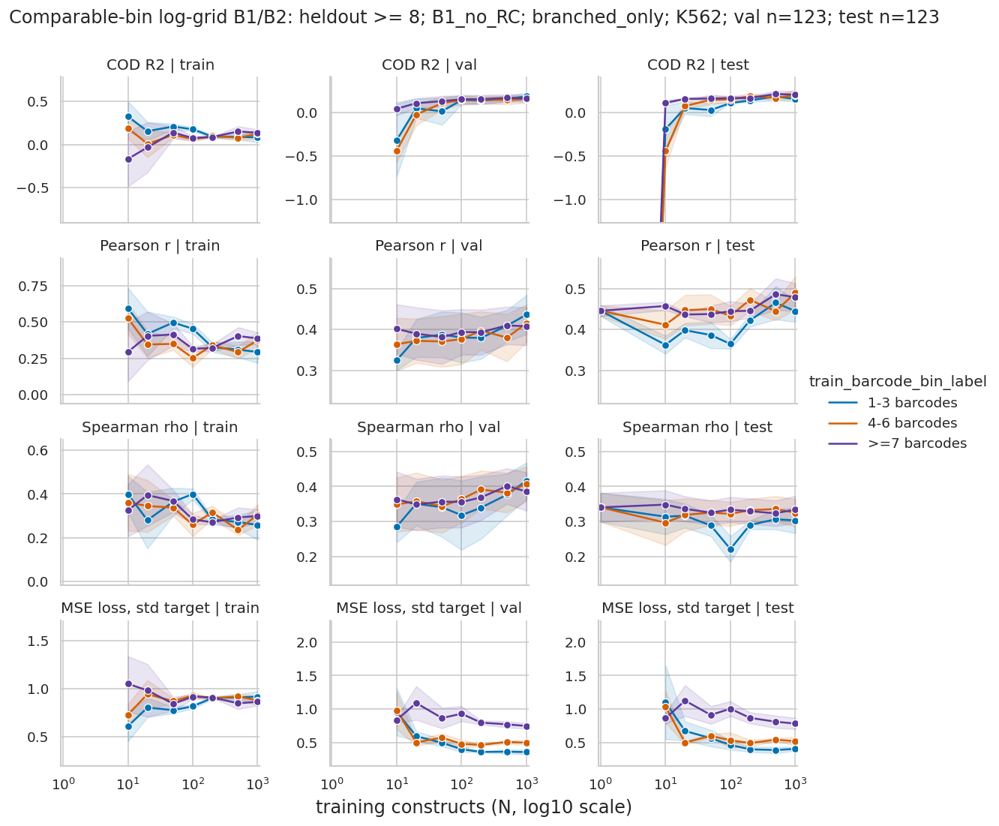

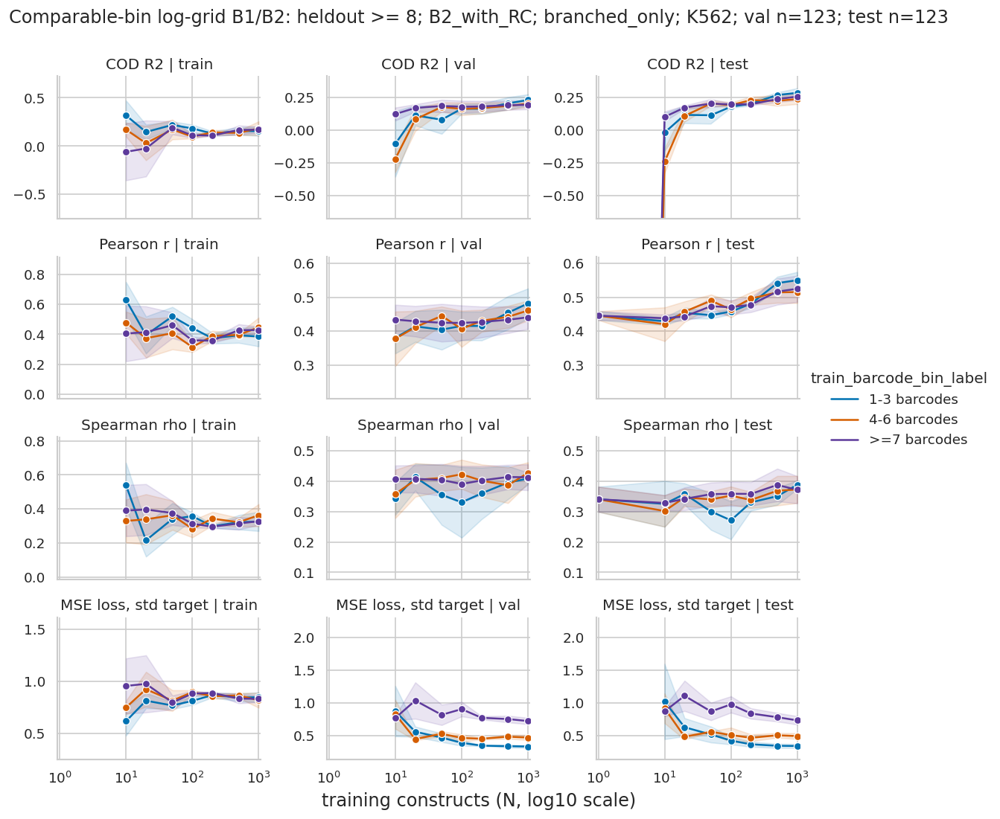

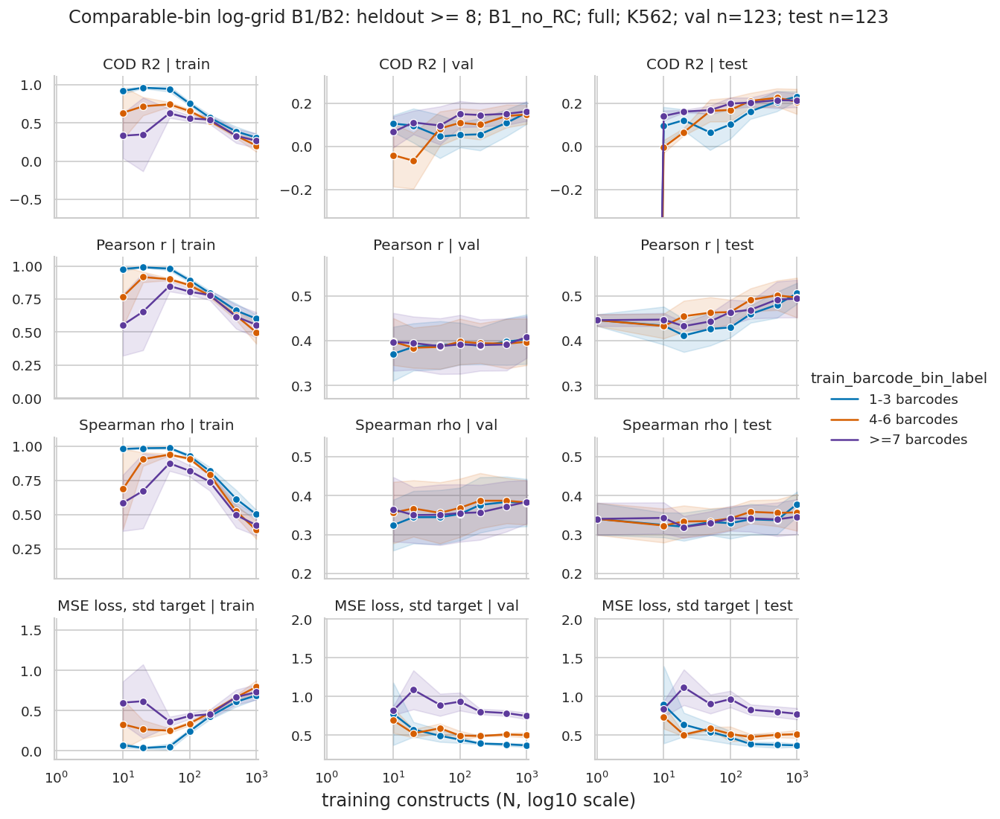

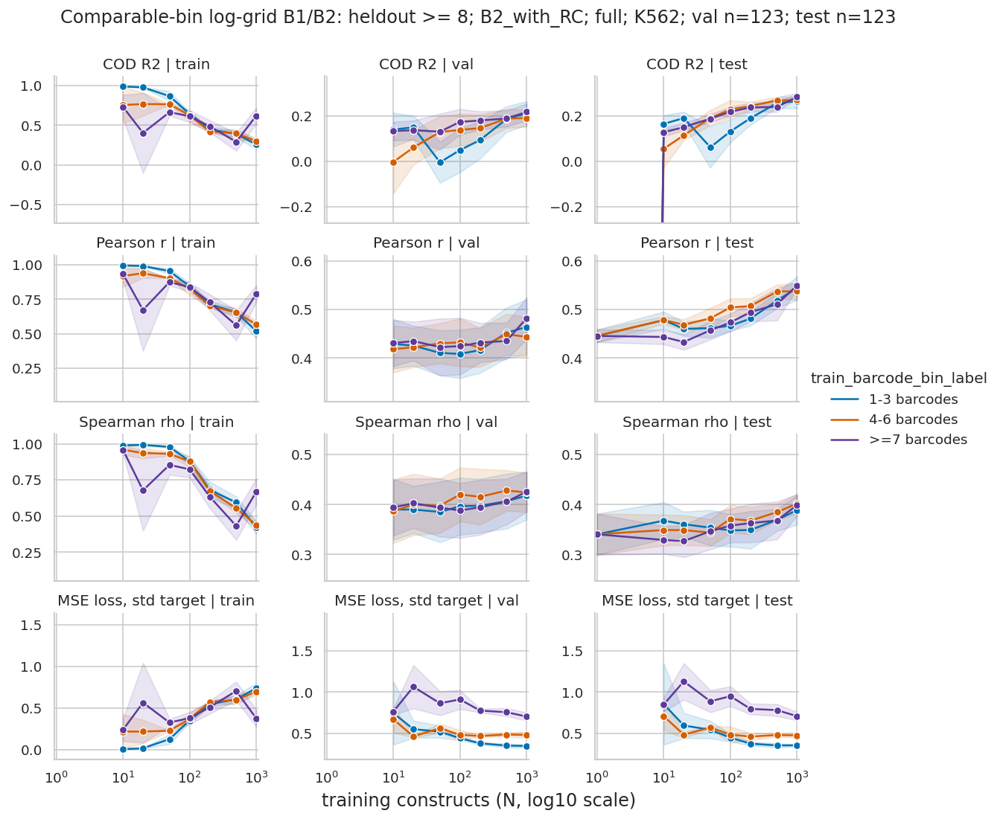

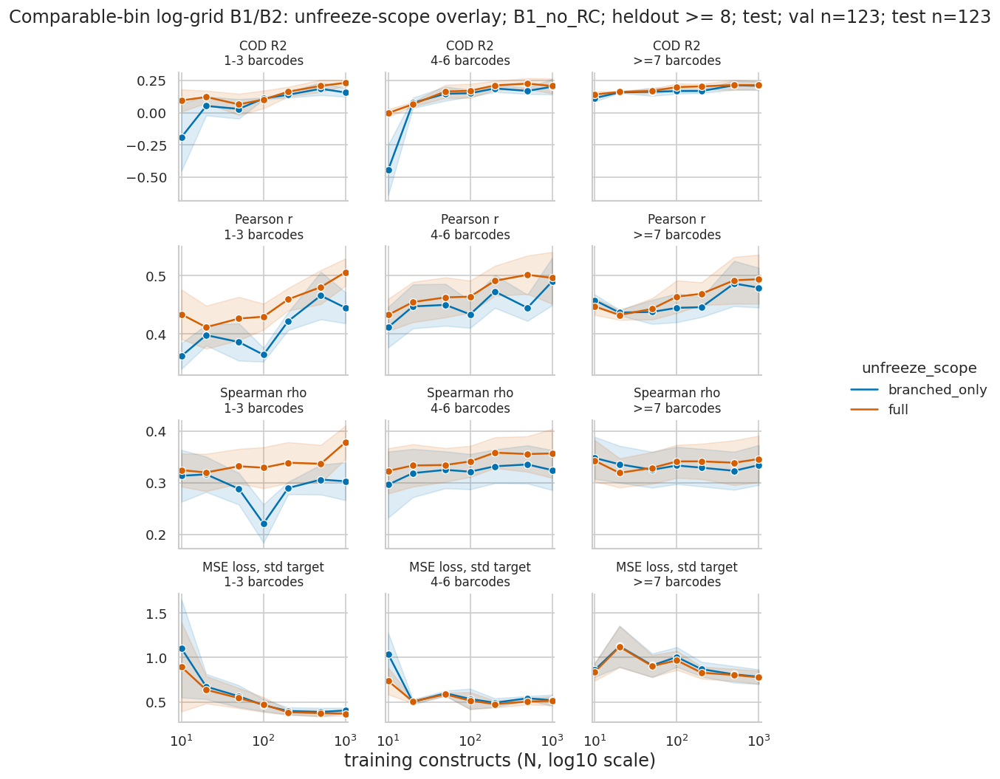

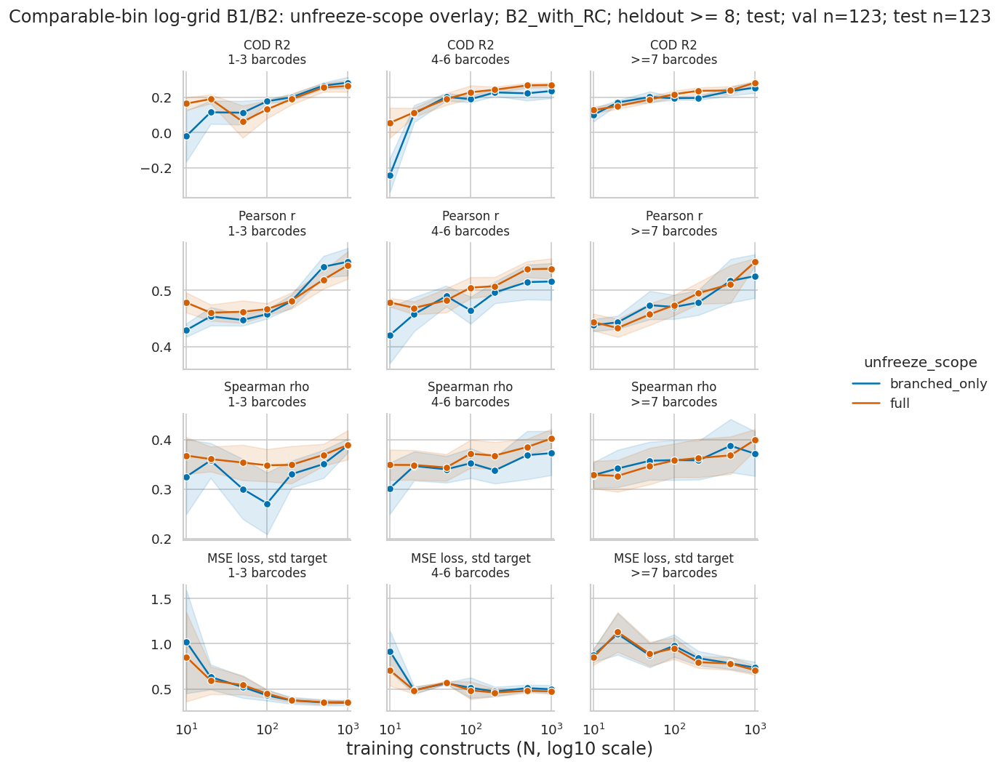

In [9]:
for unfreeze_scope in SCOPES_TO_PLOT:
    for setting in ["B1_no_RC", "B2_with_RC"]:
        g = plot_equal_n_learning_curves(
            loggrid_perf_long,
            title_prefix=loggrid["label"],
            heldout_min=8,
            setting=setting,
            unfreeze_scope=unfreeze_scope,
            bin_label_order=RANGE_BIN_LABEL_ORDER,
            palette=RANGE_BIN_PALETTE,
            log_x=True,
            zero_shot_long=loggrid_zero_shot_long,
        )
        plt.show()

for setting in ["B1_no_RC", "B2_with_RC"]:
    g = plot_unfreeze_scope_comparison(
        loggrid_perf_long,
        title_prefix=loggrid["label"],
        heldout_min=8,
        setting=setting,
        split="test",
        bin_label_order=RANGE_BIN_LABEL_ORDER,
        log_x=True,
    )
    plt.show()

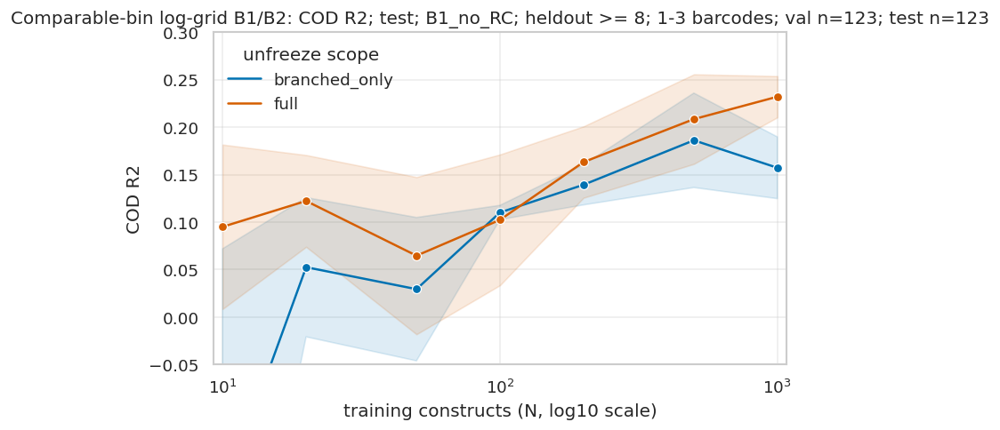

In [10]:
fig, ax = plot_learning_curve_zoom(
    loggrid_perf_long,
    title_prefix=loggrid["label"],
    metric_root="cod_r2",
    split="test",
    heldout_min=8,
    setting="B1_no_RC",
    barcode_bins="1-3 barcodes",
    color_by="unfreeze_scope",
    train_size_min=10,
    ylim=(-0.05, 0.30),
)
plt.show()

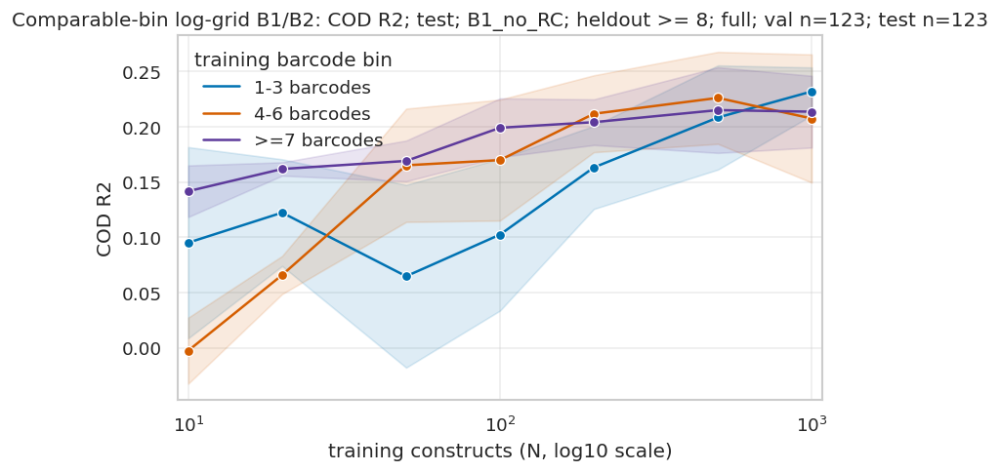

In [22]:
fig, ax = plot_learning_curve_zoom(
    loggrid_perf_long,
    title_prefix=loggrid["label"],
    metric_root="cod_r2",
    split="test",
    heldout_min=8,
    setting="B1_no_RC",
    unfreeze_scope="full",
    color_by="barcode_bin",
    bin_label_order=RANGE_BIN_LABEL_ORDER,
    palette=RANGE_BIN_PALETTE,
    train_size_min=10,
)
plt.show()

### Log-grid low-bin deltas

Positive values below mean the candidate barcode bin beats the `>=7 barcodes` reference for the same seed, heldout threshold, setting, and N. For loss, the sign is flipped so positive still means better.

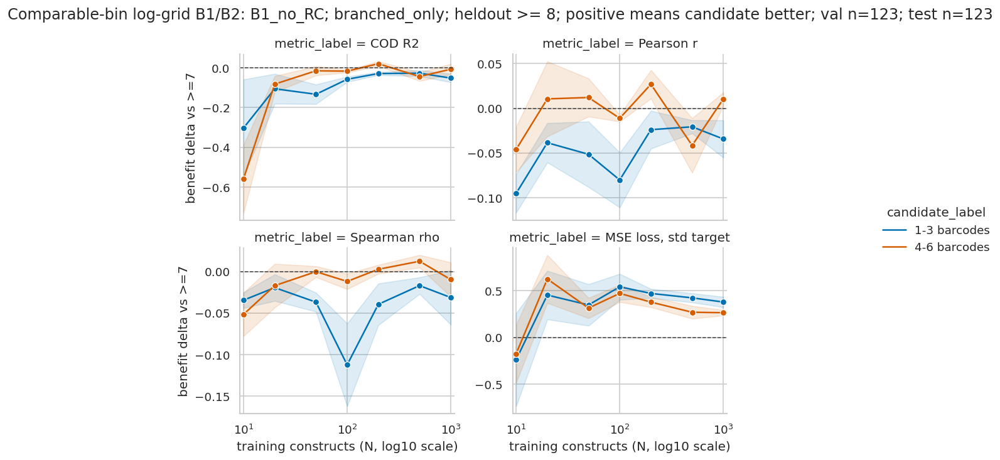

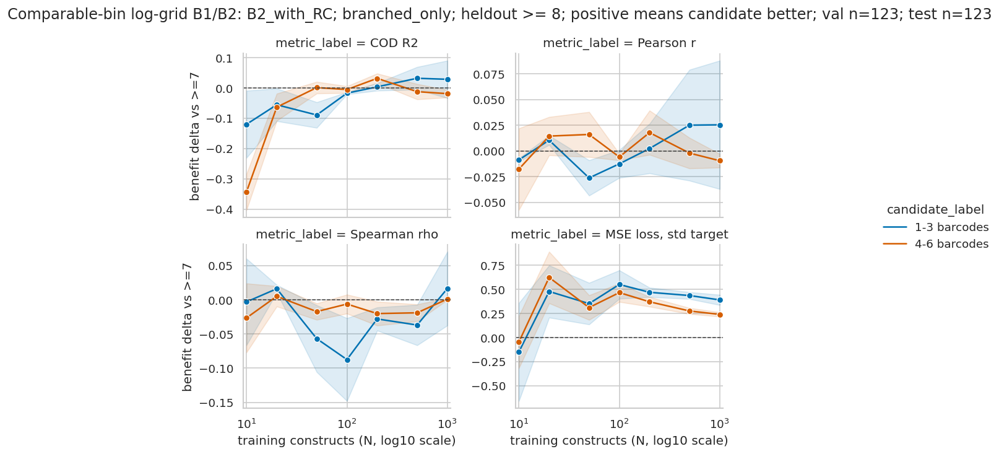

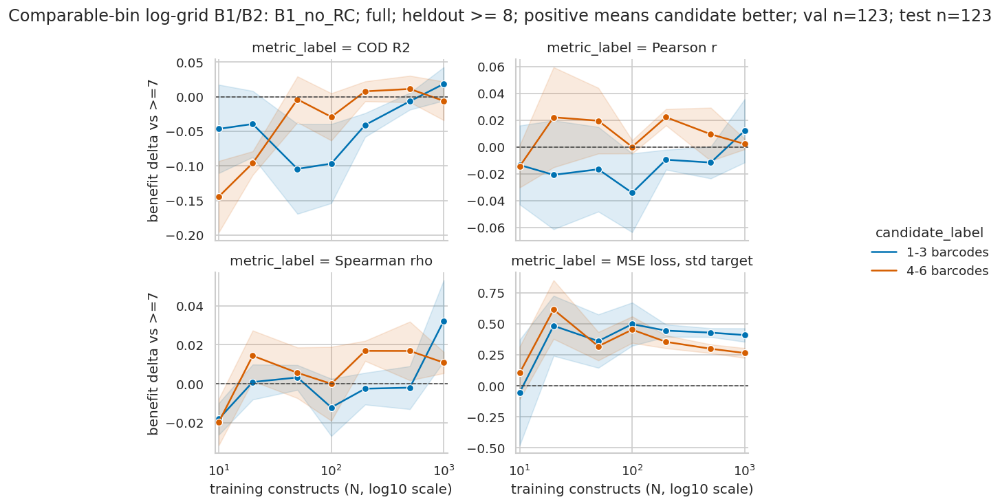

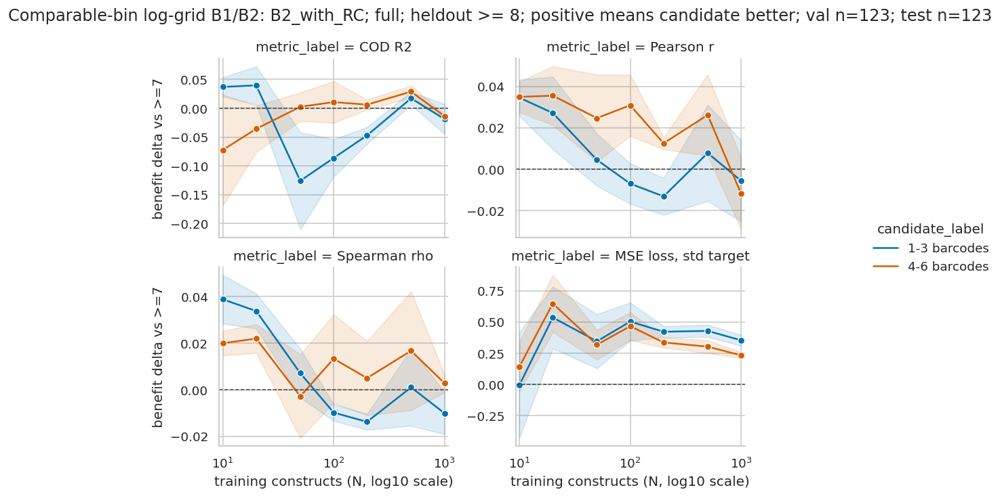

In [11]:
def compute_paired_bin_deltas(
    frame: pd.DataFrame,
    *,
    split="test",
    reference_label=">=7 barcodes",
    candidate_labels=None,
    metrics=METRIC_ROOTS,
) -> pd.DataFrame:
    if candidate_labels is None:
        candidate_labels = [label for label in infer_bin_order(frame["train_barcode_bin_label"]) if label != reference_label]
    key_cols = [
        "run_key",
        "run_label",
        "seed",
        "heldout_min_barcodes",
        "setting",
        "init_head",
        "unfreeze_scope",
        "train_sampling_mode",
        "train_size",
        "val_size_raw",
        "test_size_raw",
    ]
    key_cols = [col for col in key_cols if col in frame.columns]
    records = []
    for metric_root in metrics:
        metric_col = METRIC_SPECS[metric_root]["cols"][split]
        if metric_col not in frame.columns:
            continue
        wide = frame.pivot_table(
            index=key_cols,
            columns="train_barcode_bin_label",
            values=metric_col,
            aggfunc="first",
            observed=True,
        )
        if reference_label not in wide.columns:
            continue
        for candidate_label in candidate_labels:
            if candidate_label not in wide.columns:
                continue
            delta = wide[candidate_label] - wide[reference_label]
            part = delta.rename("raw_delta").reset_index().dropna(subset=["raw_delta"])
            part["candidate_label"] = candidate_label
            part["reference_label"] = reference_label
            part["split"] = split
            part["metric_root"] = metric_root
            part["metric_label"] = METRIC_SPECS[metric_root]["label"]
            part["higher_is_better"] = METRIC_SPECS[metric_root]["higher_is_better"]
            part["benefit_delta"] = np.where(part["higher_is_better"], part["raw_delta"], -part["raw_delta"])
            records.append(part)
    return pd.concat(records, ignore_index=True) if records else pd.DataFrame()


def plot_paired_bin_deltas(
    paired: pd.DataFrame,
    *,
    title_prefix: str,
    heldout_min=8,
    setting="B2_with_RC",
    unfreeze_scope=DEFAULT_UNFREEZE_SCOPE,
    candidates=None,
    log_x=True,
    title_context=None,
):
    plot_df = paired.copy()
    if "heldout_min_barcodes" in plot_df.columns:
        plot_df = plot_df[plot_df["heldout_min_barcodes"] == heldout_min]
    plot_df = plot_df[plot_df["setting"] == setting]
    if unfreeze_scope is not None and "unfreeze_scope" in plot_df.columns:
        plot_df = plot_df[plot_df["unfreeze_scope"] == unfreeze_scope]
    if candidates is not None:
        plot_df = plot_df[plot_df["candidate_label"].isin(candidates)]
    plot_df = coerce_numeric_column(plot_df, "train_size", positive_only=log_x)
    if plot_df.empty:
        raise ValueError("No paired delta rows after filtering.")
    order = infer_bin_order(plot_df["candidate_label"])
    palette = {**RANGE_BIN_PALETTE, **EXACT_BIN_PALETTE}
    g = sns.relplot(
        data=plot_df,
        x="train_size",
        y="benefit_delta",
        hue="candidate_label",
        hue_order=order,
        palette={k: palette.get(k, c) for k, c in zip(order, sns.color_palette("colorblind", len(order)))},
        col="metric_label",
        col_order=METRIC_LABEL_ORDER,
        col_wrap=2,
        kind="line",
        marker="o",
        estimator="mean",
        errorbar="se",
        err_kws={"alpha": ERROR_BAND_ALPHA},
        height=3.1,
        aspect=1.25,
        facet_kws={"sharex": True, "sharey": False},
    )
    for ax in g.axes.flat:
        ax.axhline(0, color="0.25", linewidth=0.9, linestyle="--")
        if log_x:
            apply_log10_xaxis(ax, plot_df["train_size"])
    g.set_axis_labels("training constructs (N, log10 scale)" if log_x else "training constructs (N)", "benefit delta vs >=7")
    g.fig.subplots_adjust(top=0.88)
    if title_context is None:
        title_context = barcode_split_size_label(plot_df, heldout_min=heldout_min)
    title = f"{title_prefix}: {setting}; {unfreeze_scope}; heldout >= {heldout_min}; positive means candidate better"
    g.fig.suptitle(append_title_context(title, title_context))
    return g


loggrid_paired = compute_paired_bin_deltas(loggrid["runs"], split="test")
for unfreeze_scope in SCOPES_TO_PLOT:
    for setting in ["B1_no_RC", "B2_with_RC"]:
        g = plot_paired_bin_deltas(
            loggrid_paired,
            title_prefix=loggrid["label"],
            heldout_min=8,
            setting=setting,
            unfreeze_scope=unfreeze_scope,
            candidates=["1-3 barcodes", "4-6 barcodes"],
            log_x=True,
        )
        plt.show()

## Exact-low barcode B1/B2

This is the cleaner run for the teammate question: barcode=1 is separated from barcode=2 and barcode=3, while `4-6` and `>=7` remain as higher-quality references. The cap is 500, so the endpoint is lower than loggrid's `N=1000`.

Endpoint summary at N=500, heldout >= 8

,setting,unfreeze_scope,train_barcode_bin_label,metric_label,mean,se,n
0,B1_no_RC,branched_only,1 barcode,COD R2,0.091265,0.028277,3
1,B1_no_RC,branched_only,1 barcode,"MSE loss, std target",0.365132,0.015469,3
2,B1_no_RC,branched_only,1 barcode,Pearson r,0.416639,0.023019,3
3,B1_no_RC,branched_only,1 barcode,Spearman rho,0.310981,0.025089,3
4,B1_no_RC,branched_only,2 barcodes,COD R2,0.172386,0.036186,3
5,B1_no_RC,branched_only,2 barcodes,"MSE loss, std target",0.390258,0.033425,3
6,B1_no_RC,branched_only,2 barcodes,Pearson r,0.448771,0.022818,3
7,B1_no_RC,branched_only,2 barcodes,Spearman rho,0.322098,0.041824,3
8,B1_no_RC,branched_only,3 barcodes,COD R2,0.182508,0.029227,3
9,B1_no_RC,branched_only,3 barcodes,"MSE loss, std target",0.460267,0.033578,3


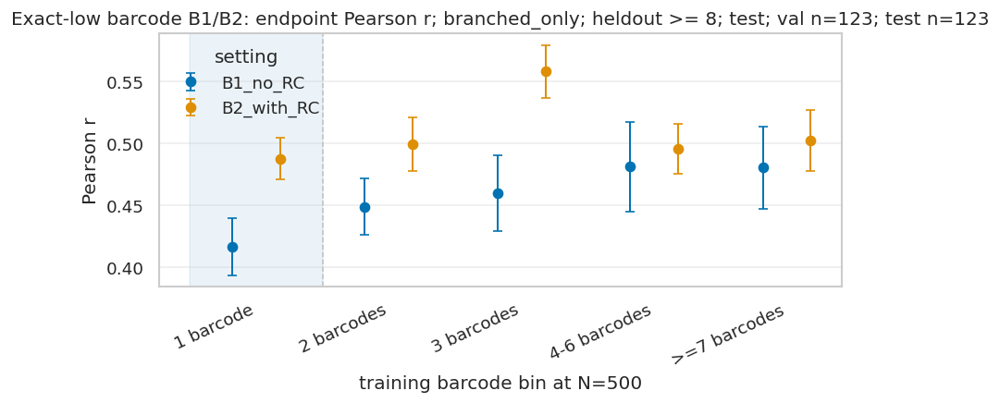

In [12]:
exact_low = bundles["exact_low"]
exact_perf_long = make_metric_long(exact_low["runs"])
exact_zero_shot_long = make_zero_shot_metric_long(exact_low.get("zero_shot"))
if exact_zero_shot_long.empty:
    exact_zero_shot_long = make_zero_shot_metric_long(read_csv_required(exact_low["combined_dir"] / "zero_shot_evaluations.csv"))

display(Markdown("Endpoint summary at N=500, heldout >= 8"))
display(endpoint_summary_table(
    exact_perf_long,
    split="test",
    heldout_min=8,
    train_size=500,
    group_cols=("setting", "unfreeze_scope", "train_barcode_bin_label", "metric_label"),
))


def plot_exact_low_endpoint_comparison(
    perf_long: pd.DataFrame,
    *,
    metric_root="pearson",
    split="test",
    heldout_min=8,
    train_size=500,
    unfreeze_scope=DEFAULT_UNFREEZE_SCOPE,
    settings=("B1_no_RC", "B2_with_RC"),
    bin_label_order=EXACT_BIN_LABEL_ORDER,
):
    metric_label = METRIC_SPECS[metric_root]["label"]
    plot_df = perf_long[
        (perf_long["split"] == split)
        & (perf_long["metric_root"] == metric_root)
        & (perf_long["setting"].isin(settings))
    ].copy()
    if "heldout_min_barcodes" in plot_df.columns:
        plot_df = plot_df[plot_df["heldout_min_barcodes"] == heldout_min]
    if unfreeze_scope is not None and "unfreeze_scope" in plot_df.columns:
        plot_df = plot_df[plot_df["unfreeze_scope"] == unfreeze_scope]
    plot_df = coerce_numeric_column(plot_df, "train_size")
    plot_df = plot_df[plot_df["train_size"] == train_size]
    plot_df = plot_df[np.isfinite(plot_df["value"])]
    if plot_df.empty:
        raise ValueError("No endpoint rows after filtering.")

    bin_label_order = [label for label in bin_label_order if label in set(plot_df["train_barcode_bin_label"].astype(str))]
    summary = (
        plot_df.groupby(["setting", "train_barcode_bin_label"], observed=True, dropna=False)
        .agg(
            mean=("value", "mean"),
            se=("value", lambda x: x.std(ddof=1) / np.sqrt(x.count()) if x.count() > 1 else np.nan),
            n=("value", "count"),
        )
        .reset_index()
    )

    x_positions = np.arange(len(bin_label_order), dtype=float)
    offsets = np.linspace(-0.18, 0.18, len(settings)) if len(settings) > 1 else np.array([0.0])
    setting_palette = dict(zip(settings, sns.color_palette("colorblind", len(settings))))
    fig, ax = plt.subplots(figsize=(7.3, 3.8))
    ax.axvspan(-0.5, 0.5, color=EXACT_BIN_PALETTE.get("1 barcode", "0.5"), alpha=0.08, zorder=0)
    ax.axvline(0.5, color="0.75", linewidth=0.9, linestyle="--", zorder=0)

    for setting, offset in zip(settings, offsets):
        part = summary[summary["setting"] == setting].set_index("train_barcode_bin_label").reindex(bin_label_order)
        valid = np.isfinite(part["mean"].to_numpy(dtype=float))
        ax.errorbar(
            x_positions[valid] + offset,
            part.loc[valid, "mean"],
            yerr=part.loc[valid, "se"],
            fmt="o",
            capsize=3,
            elinewidth=1.2,
            markersize=6,
            color=setting_palette[setting],
            label=setting,
        )

    ax.set_xticks(x_positions)
    ax.set_xticklabels(bin_label_order, rotation=25, ha="right")
    ax.set_xlabel("training barcode bin at N=500")
    ax.set_ylabel(metric_label)
    title = f"{exact_low['label']}: endpoint {metric_label}; {unfreeze_scope}; heldout >= {heldout_min}; {split}"
    ax.set_title(append_title_context(title, barcode_split_size_label(plot_df, heldout_min=heldout_min)))
    ax.legend(title="setting", frameon=False)
    ax.grid(True, axis="y", alpha=0.35)
    ax.grid(False, axis="x")
    fig.tight_layout()
    return fig, ax, summary


endpoint_metric_root = "pearson"
fig, ax, exact_endpoint_metric_summary = plot_exact_low_endpoint_comparison(
    exact_perf_long,
    metric_root=endpoint_metric_root,
    split="test",
    heldout_min=8,
    train_size=500,
    unfreeze_scope=DEFAULT_UNFREEZE_SCOPE,
)
plt.show()

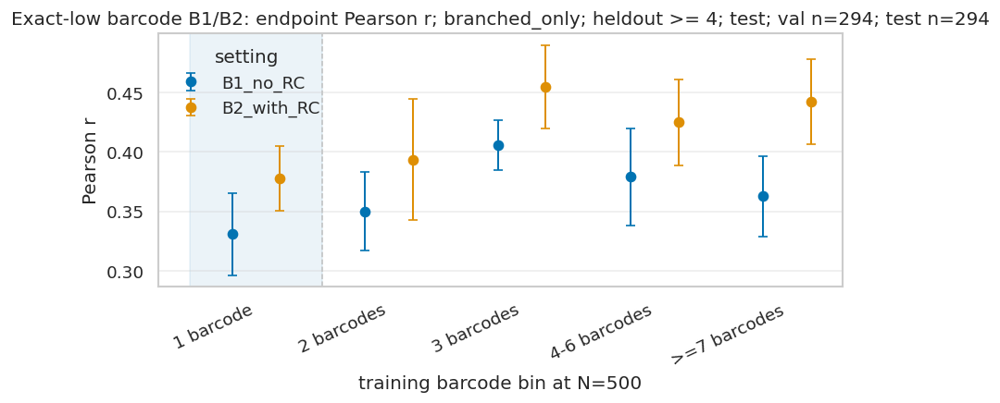

In [13]:
fig, ax, exact_endpoint_metric_summary = plot_exact_low_endpoint_comparison(
    exact_perf_long,
    metric_root=endpoint_metric_root,
    split="test",
    heldout_min=4,
    train_size=500,
    unfreeze_scope=DEFAULT_UNFREEZE_SCOPE,
)
plt.show()

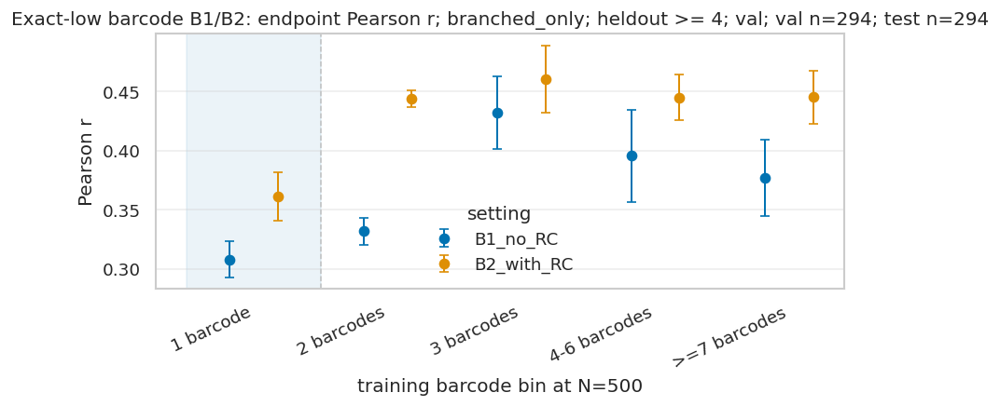

In [14]:
fig, ax, exact_endpoint_metric_summary = plot_exact_low_endpoint_comparison(
    exact_perf_long,
    metric_root=endpoint_metric_root,
    split="val",
    heldout_min=4,
    train_size=500,
    unfreeze_scope=DEFAULT_UNFREEZE_SCOPE,
)
plt.show()

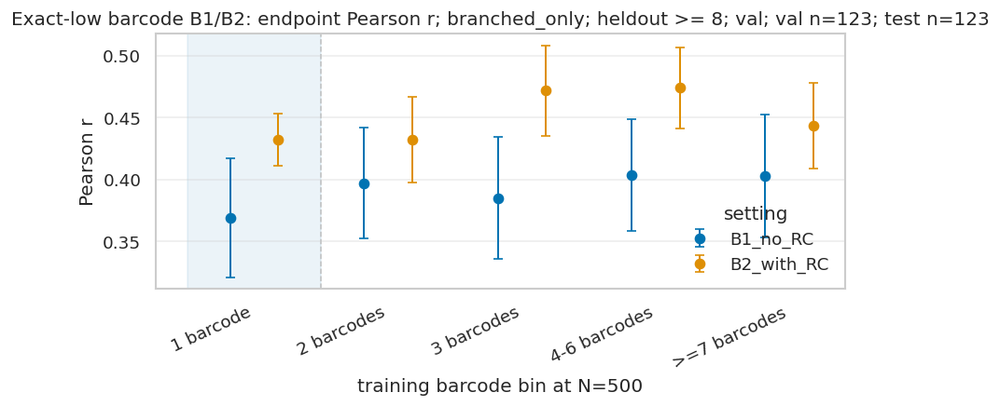

In [15]:
fig, ax, exact_endpoint_metric_summary = plot_exact_low_endpoint_comparison(
    exact_perf_long,
    metric_root=endpoint_metric_root,
    split="val",
    heldout_min=8,
    train_size=500,
    unfreeze_scope=DEFAULT_UNFREEZE_SCOPE,
)
plt.show()


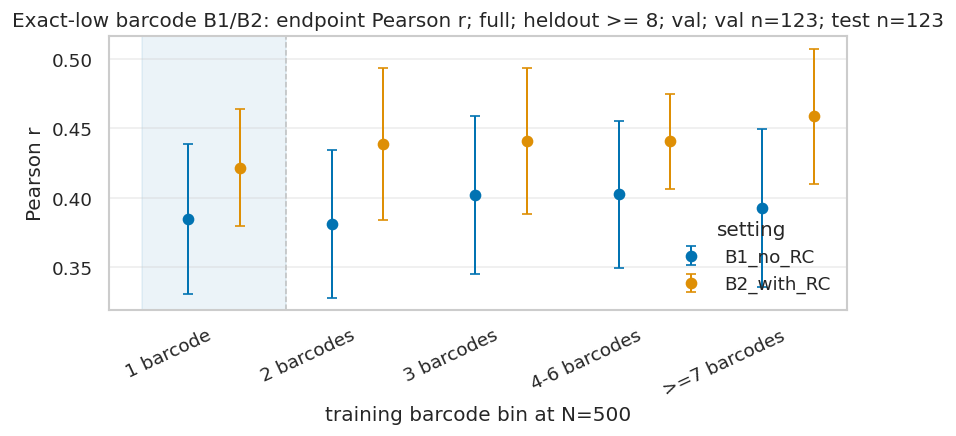

In [16]:
fig, ax, exact_endpoint_metric_summary = plot_exact_low_endpoint_comparison(
    exact_perf_long,
    metric_root=endpoint_metric_root,
    split="val",
    heldout_min=8,
    train_size=500,
    unfreeze_scope="full",
)
plt.show()

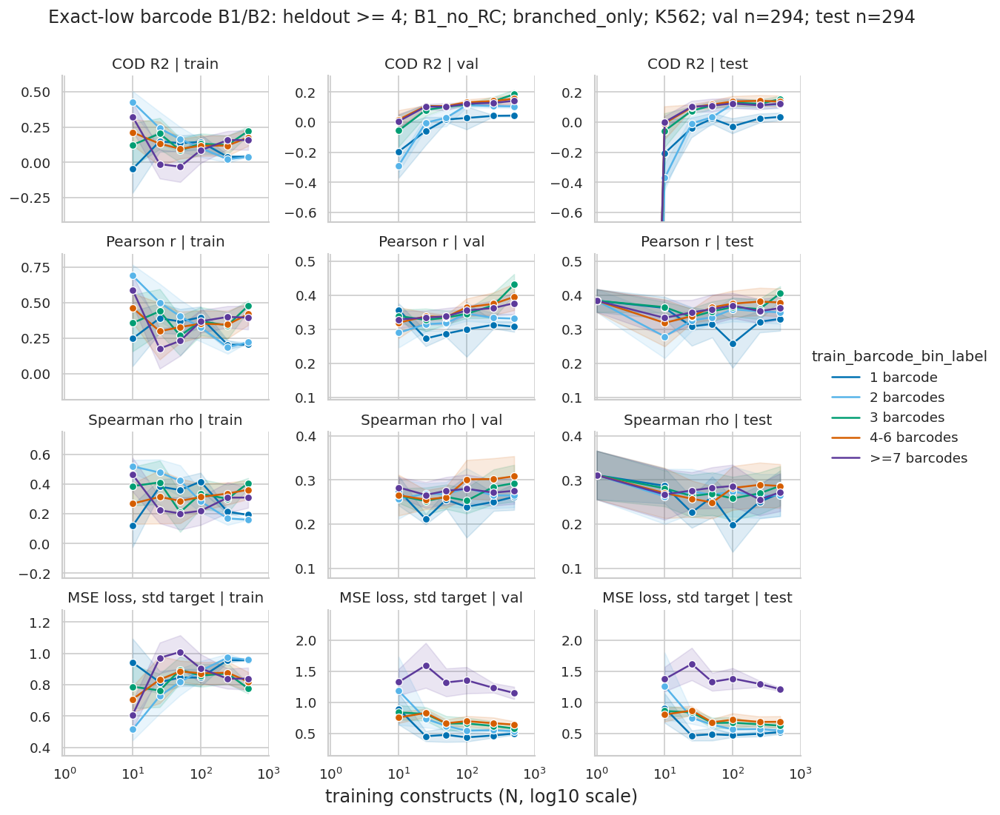

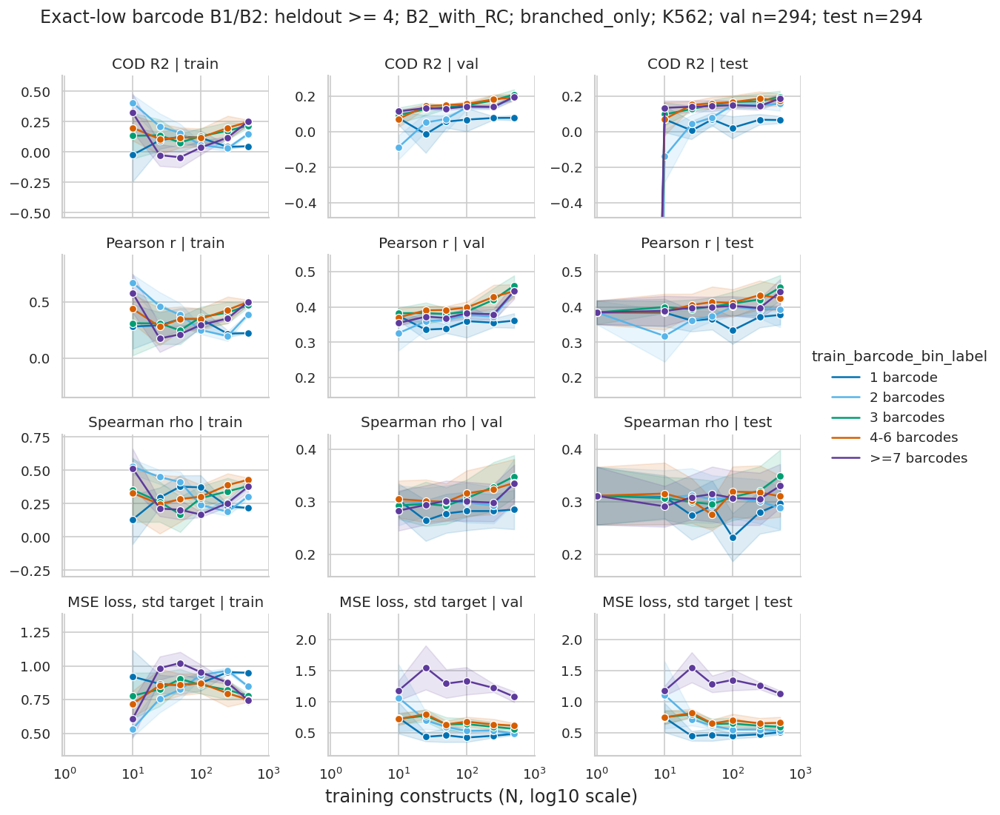

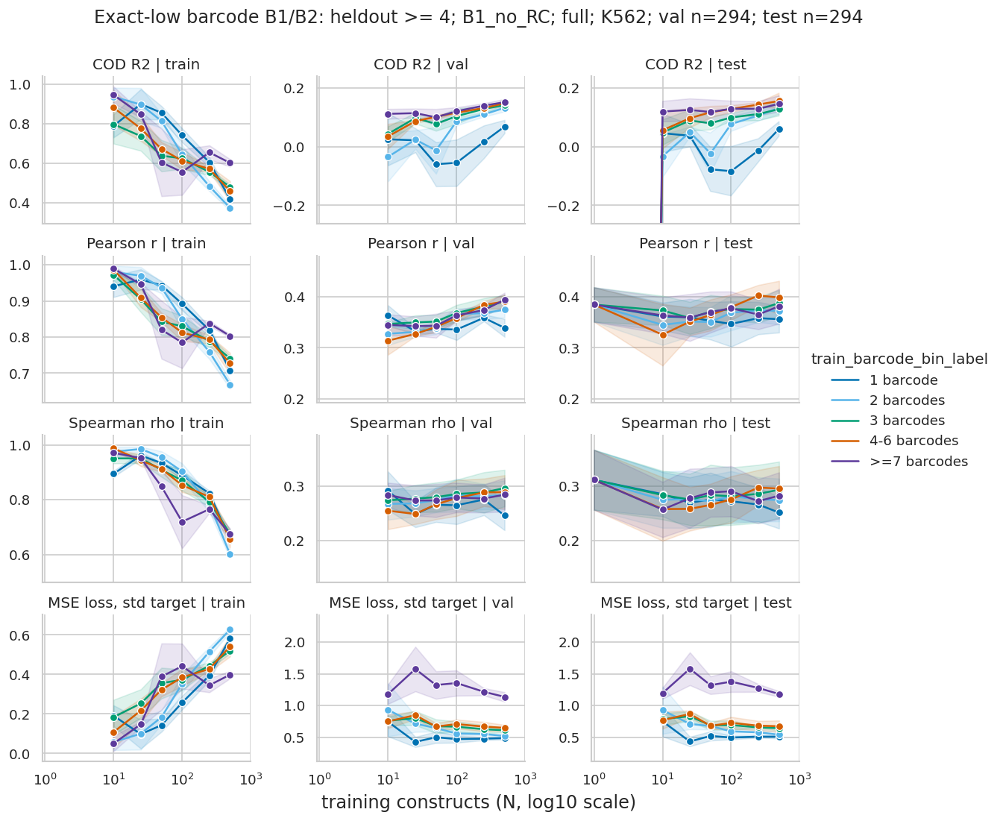

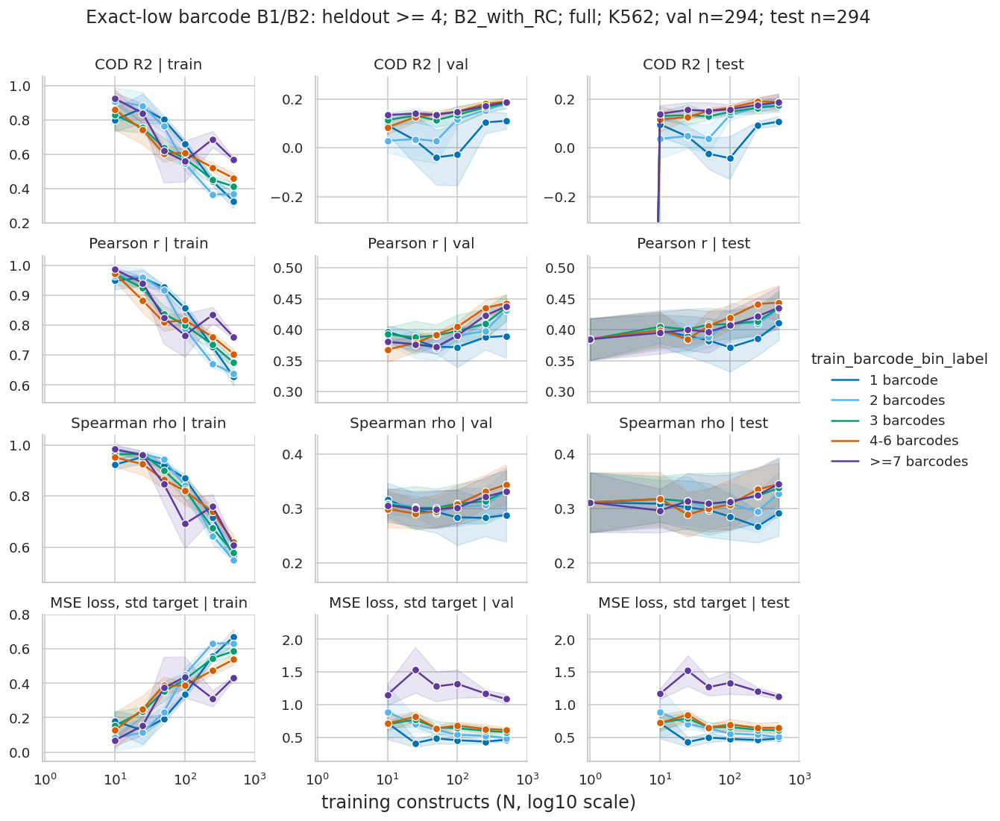

In [17]:
for unfreeze_scope in SCOPES_TO_PLOT:
    for setting in ["B1_no_RC", "B2_with_RC"]:
        g = plot_equal_n_learning_curves(
            exact_perf_long,
            title_prefix=exact_low["label"],
            heldout_min=4,
            setting=setting,
            unfreeze_scope=unfreeze_scope,
            bin_label_order=EXACT_BIN_LABEL_ORDER,
            palette=EXACT_BIN_PALETTE,
            log_x=True,
            zero_shot_long=exact_zero_shot_long,
        )
        plt.show()

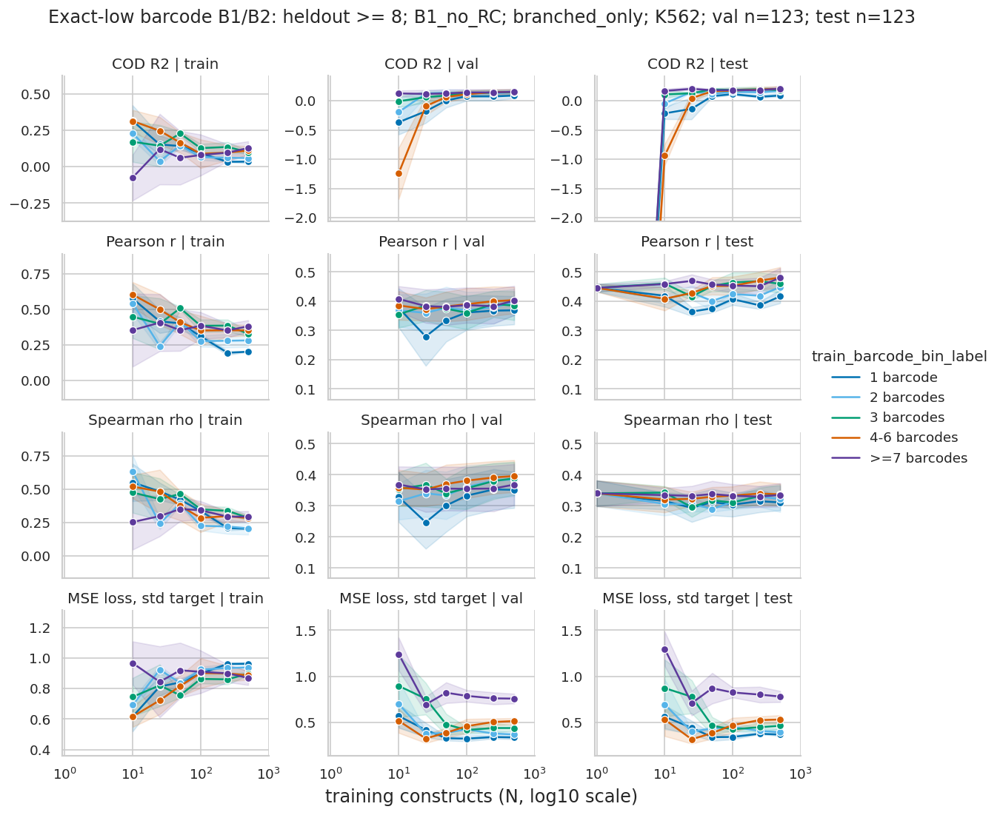

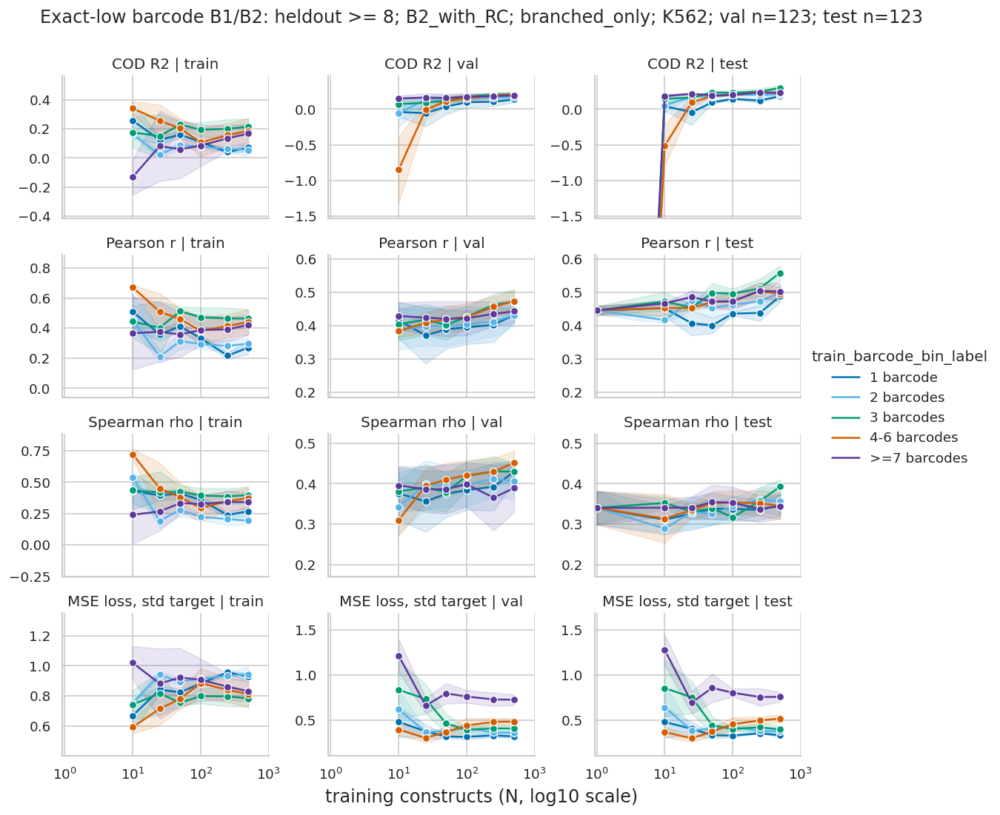

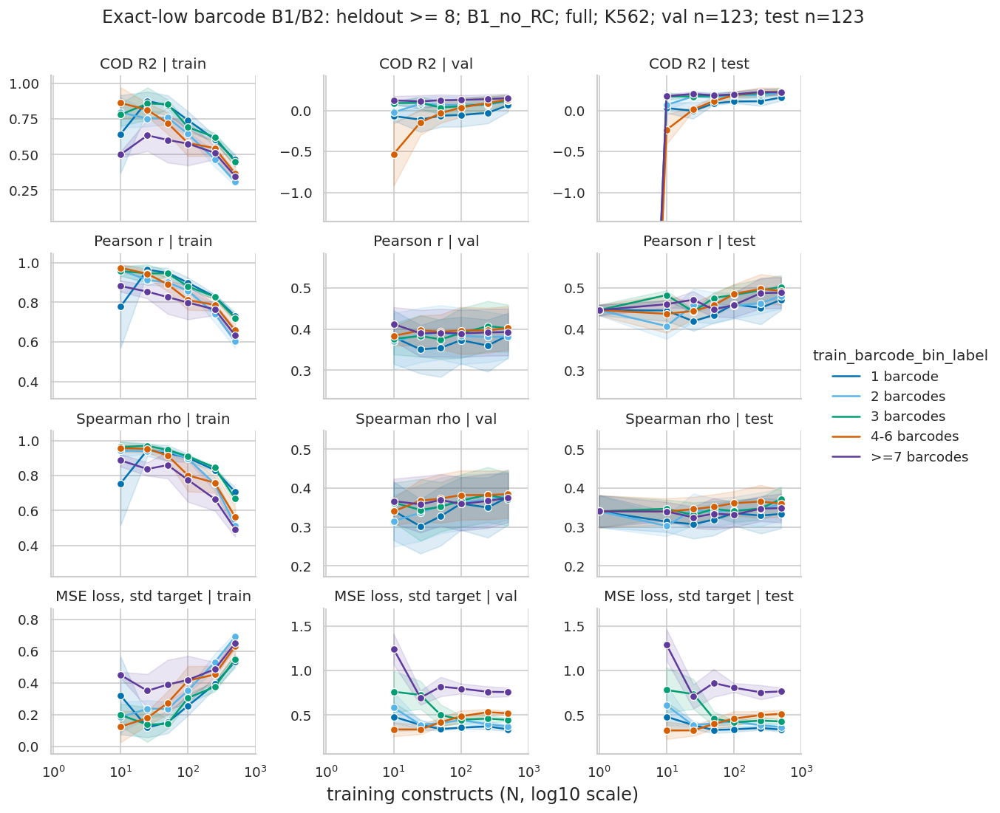

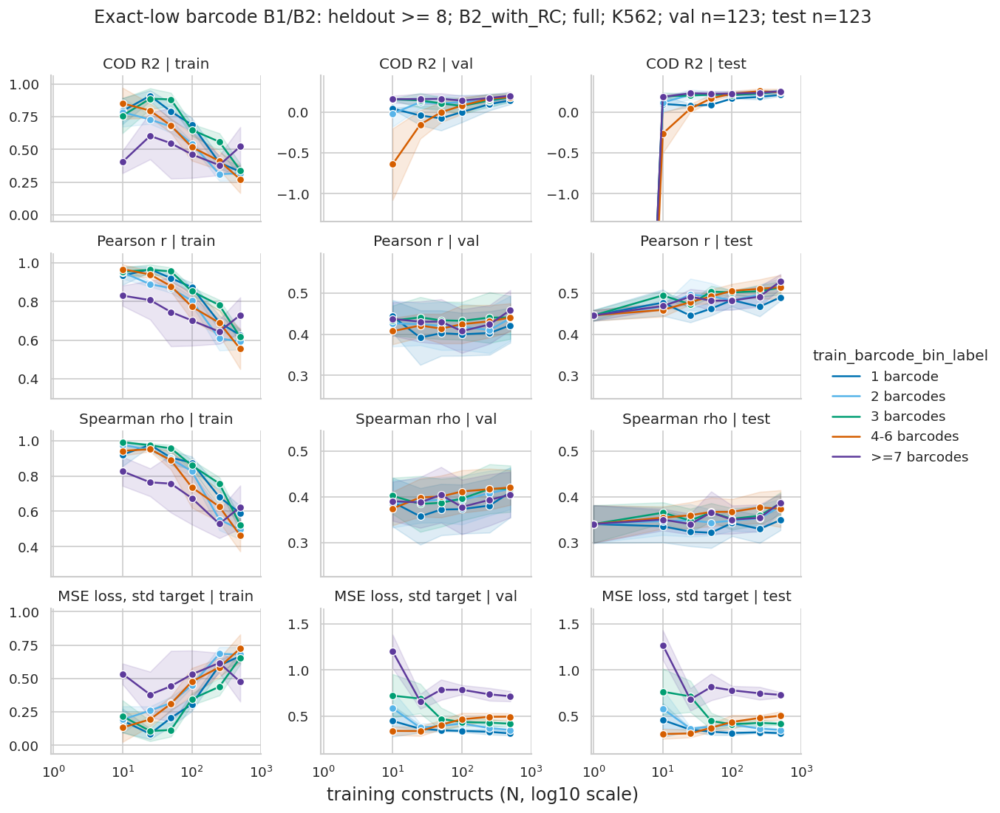

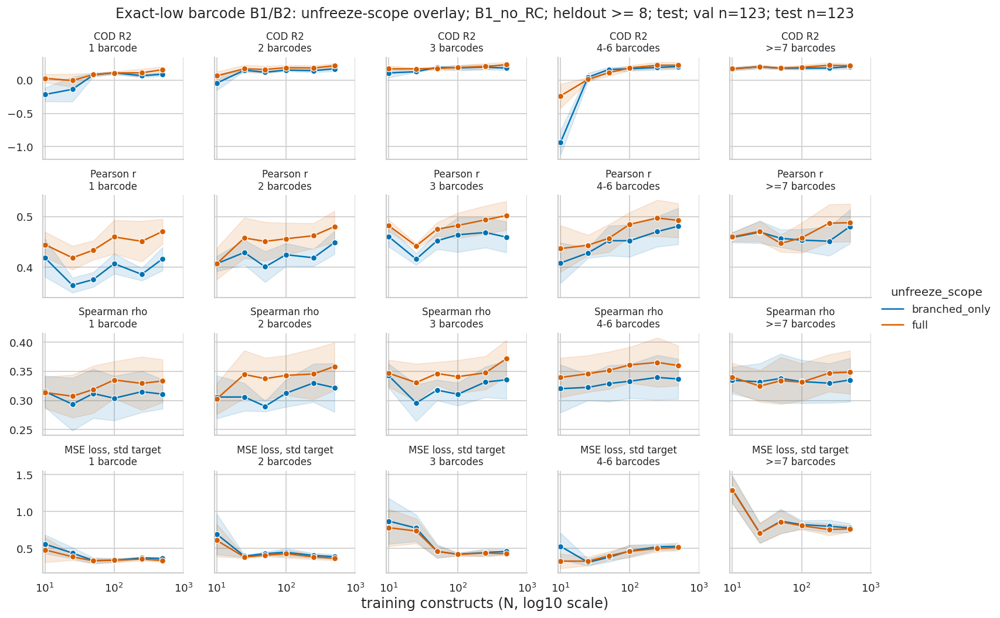

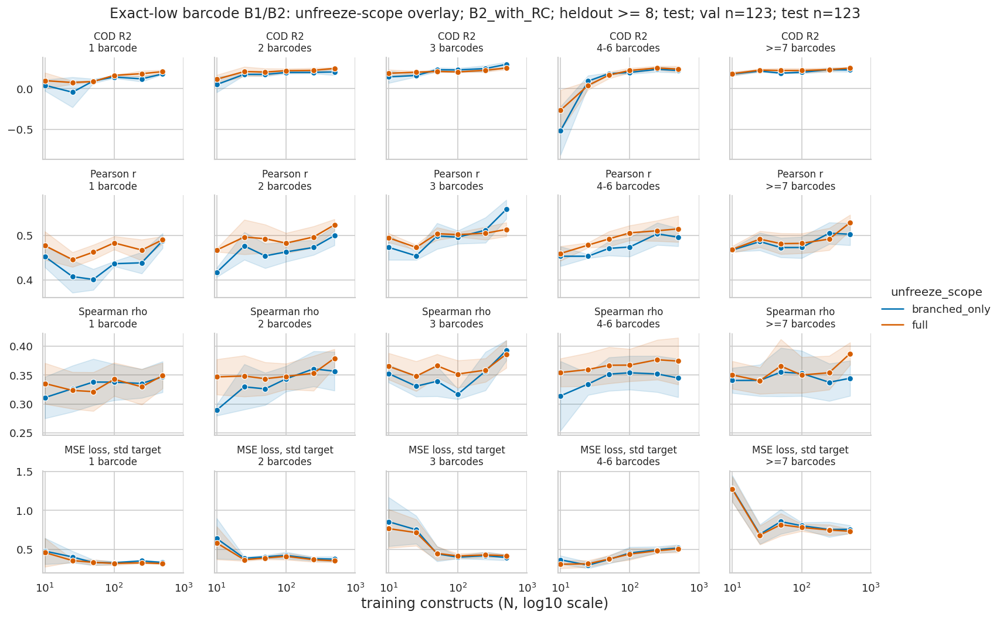

In [18]:
for unfreeze_scope in SCOPES_TO_PLOT:
    for setting in ["B1_no_RC", "B2_with_RC"]:
        g = plot_equal_n_learning_curves(
            exact_perf_long,
            title_prefix=exact_low["label"],
            heldout_min=8,
            setting=setting,
            unfreeze_scope=unfreeze_scope,
            bin_label_order=EXACT_BIN_LABEL_ORDER,
            palette=EXACT_BIN_PALETTE,
            log_x=True,
            zero_shot_long=exact_zero_shot_long,
        )
        plt.show()

for setting in ["B1_no_RC", "B2_with_RC"]:
    g = plot_unfreeze_scope_comparison(
        exact_perf_long,
        title_prefix=exact_low["label"],
        heldout_min=8,
        setting=setting,
        split="test",
        bin_label_order=EXACT_BIN_LABEL_ORDER,
        log_x=True,
    )
    plt.show()

### Exact-low deltas against the high-barcode reference

The most important line here is `1 barcode` against `>=7 barcodes`. If barcode=1 is consistently negative across COD R2/Pearson/Spearman and loss, then the single-barcode training regime is not just data-scarce; it is lower-label-quality at equal construct N. If it narrows with N, it may still be useful when construct diversity is the limiting budget.

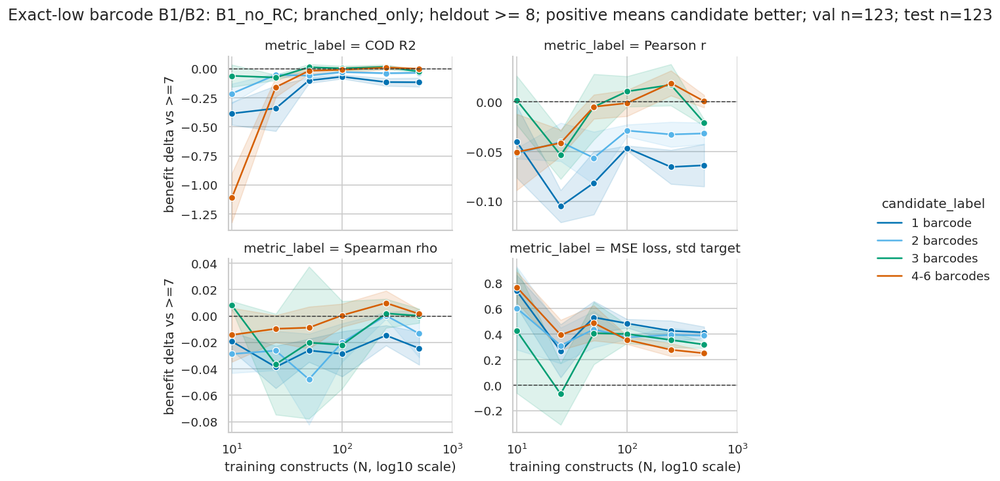

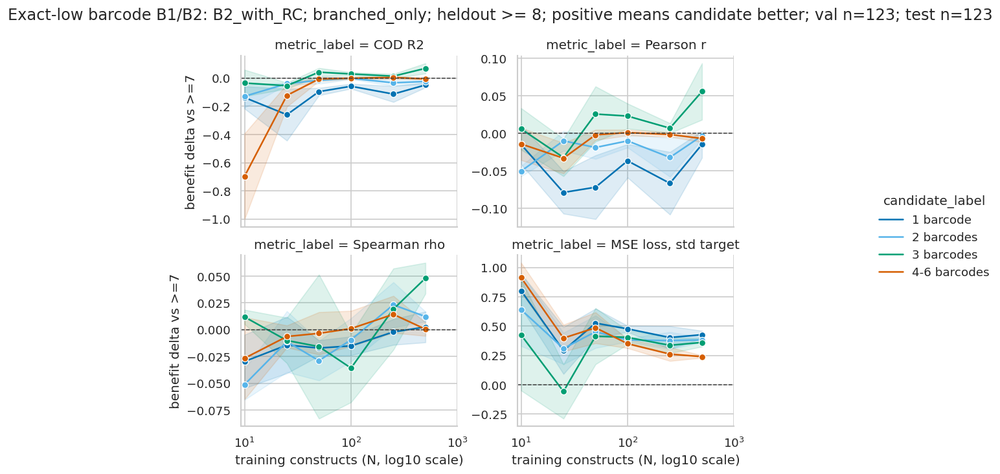

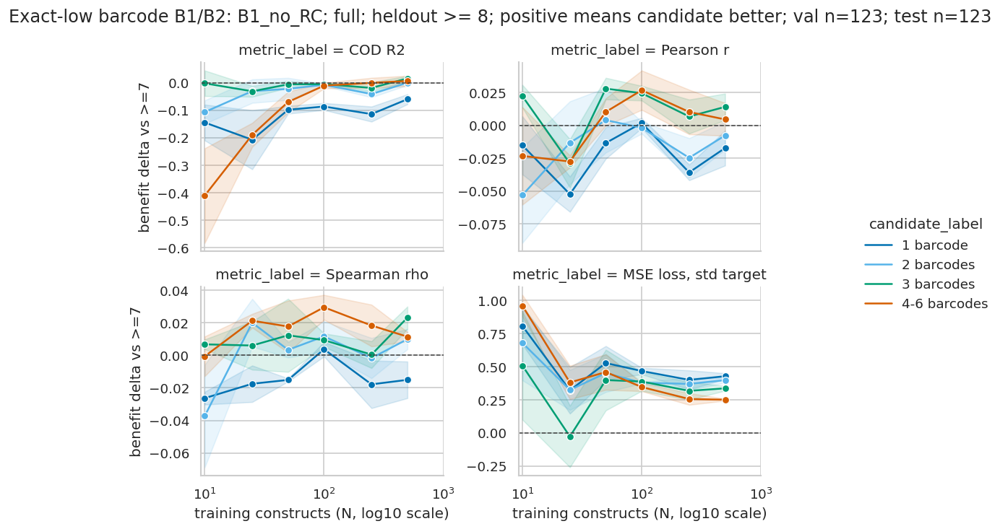

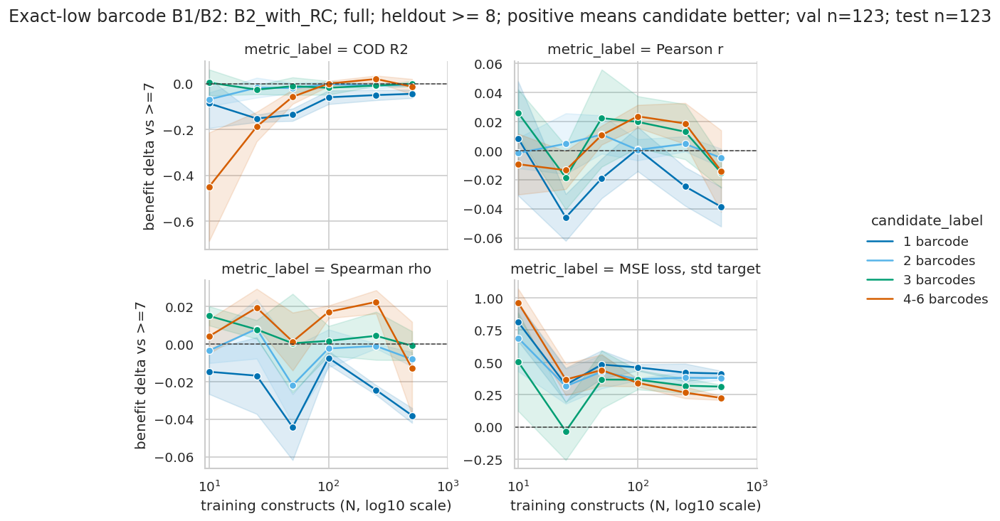

In [19]:
exact_paired = compute_paired_bin_deltas(exact_low["runs"], split="test")
for unfreeze_scope in SCOPES_TO_PLOT:
    for setting in ["B1_no_RC", "B2_with_RC"]:
        g = plot_paired_bin_deltas(
            exact_paired,
            title_prefix=exact_low["label"],
            heldout_min=8,
            setting=setting,
            unfreeze_scope=unfreeze_scope,
            candidates=["1 barcode", "2 barcodes", "3 barcodes", "4-6 barcodes"],
            log_x=True,
        )
        plt.show()

## Barcode-budget normalization

Equal construct N is the strictest comparison for "how many unique constructs did we train on?" It is not the only reasonable budget. If barcode count proxies measurement depth, then `train_size * train_barcode_mean` is a rough barcode-observation budget. This view is only a proxy, but it can separate "more constructs" from "more observations per construct."

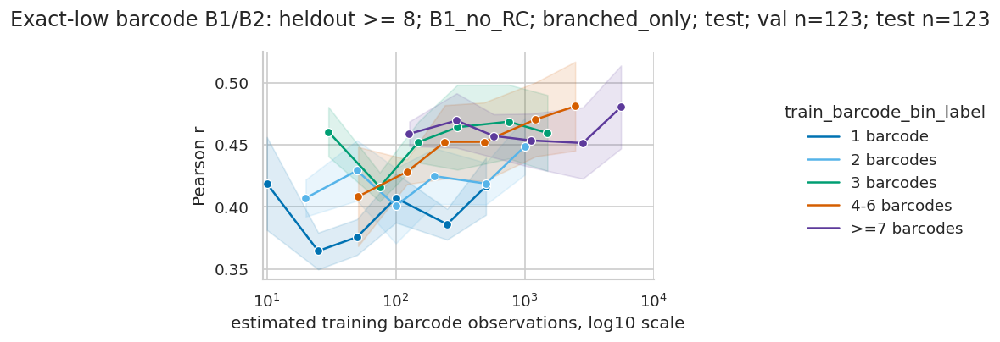

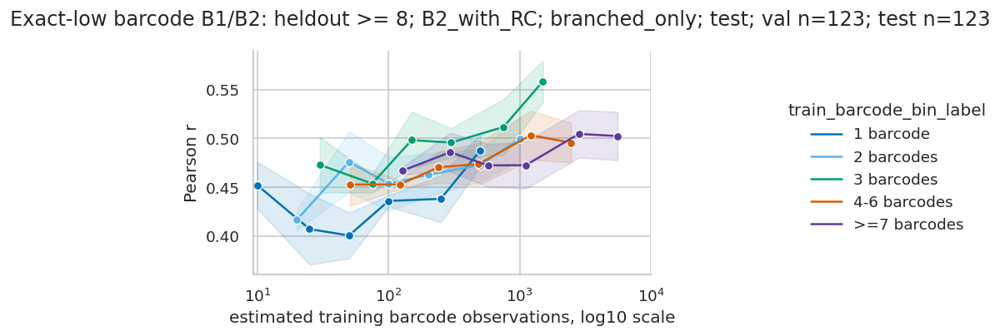

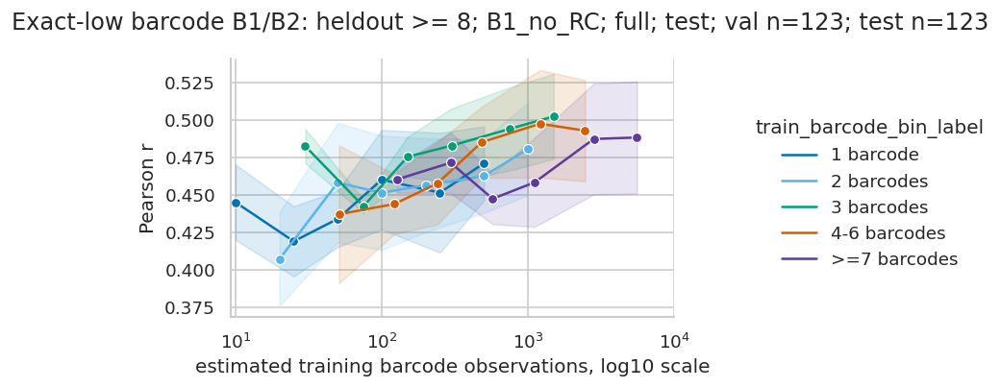

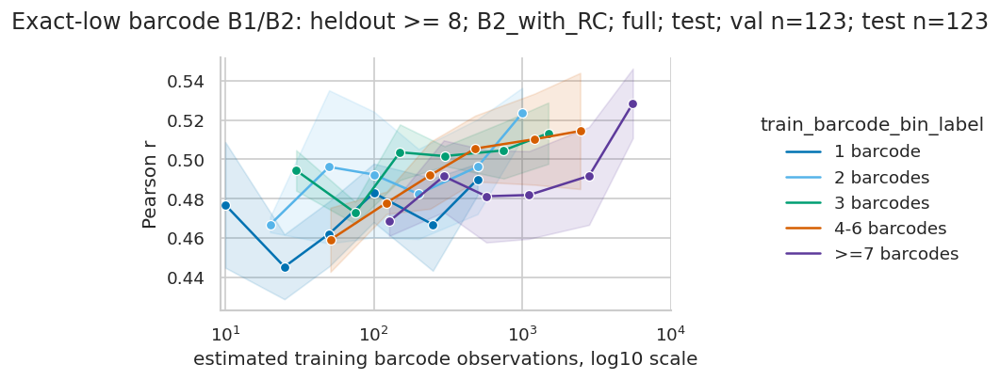

In [20]:
def add_barcode_budget(frame: pd.DataFrame) -> pd.DataFrame:
    out = frame.copy()
    if "train_barcode_mean" in out.columns:
        train_size = pd.to_numeric(out["train_size"], errors="coerce")
        barcode_mean = pd.to_numeric(out["train_barcode_mean"], errors="coerce")
        out["estimated_barcode_budget"] = train_size * barcode_mean
    else:
        out["estimated_barcode_budget"] = np.nan
    return out


def plot_budget_normalized_curves(
    frame: pd.DataFrame,
    *,
    title_prefix: str,
    heldout_min=8,
    setting="B2_with_RC",
    unfreeze_scope=DEFAULT_UNFREEZE_SCOPE,
    split="test",
    metric_root="pearson",
    bin_label_order=None,
    palette=None,
    log_x=True,
    title_context=None,
):
    metric_col = METRIC_SPECS[metric_root]["cols"][split]
    plot_df = add_barcode_budget(frame)
    if "heldout_min_barcodes" in plot_df.columns:
        plot_df = plot_df[plot_df["heldout_min_barcodes"] == heldout_min]
    plot_df = plot_df[plot_df["setting"] == setting]
    if unfreeze_scope is not None and "unfreeze_scope" in plot_df.columns:
        plot_df = plot_df[plot_df["unfreeze_scope"] == unfreeze_scope]
    plot_df = coerce_numeric_column(plot_df, "train_size")
    plot_df = coerce_numeric_column(plot_df, "estimated_barcode_budget", positive_only=log_x)
    if plot_df.empty:
        raise ValueError("No rows after filtering.")

    # Align per-seed budget estimates to one x coordinate per intended training grid point.
    budget_group_cols = [
        col
        for col in ["heldout_min_barcodes", "setting", "unfreeze_scope", "train_barcode_bin_label", "train_size"]
        if col in plot_df.columns
    ]
    plot_df["estimated_barcode_budget"] = plot_df.groupby(budget_group_cols, observed=True)[
        "estimated_barcode_budget"
    ].transform("median")

    if bin_label_order is None:
        bin_label_order = infer_bin_order(plot_df["train_barcode_bin_label"])
    if palette is None:
        palette = dict(zip(bin_label_order, sns.color_palette("colorblind", len(bin_label_order))))
    g = sns.relplot(
        data=plot_df,
        x="estimated_barcode_budget",
        y=metric_col,
        hue="train_barcode_bin_label",
        hue_order=bin_label_order,
        palette=palette,
        kind="line",
        marker="o",
        estimator="mean",
        errorbar="se",
        err_kws={"alpha": ERROR_BAND_ALPHA},
        height=3.4,
        aspect=1.55,
    )
    x_label = "estimated training barcode observations"
    if log_x:
        for ax in g.axes.flat:
            apply_log10_xaxis(ax, plot_df["estimated_barcode_budget"])
        x_label += ", log10 scale"
    g.set_axis_labels(x_label, METRIC_SPECS[metric_root]["label"])
    g.fig.subplots_adjust(top=0.86)
    if title_context is None:
        title_context = barcode_split_size_label(plot_df, heldout_min=heldout_min)
    title = f"{title_prefix}: heldout >= {heldout_min}; {setting}; {unfreeze_scope}; {split}"
    g.fig.suptitle(append_title_context(title, title_context))
    return g


for unfreeze_scope in SCOPES_TO_PLOT:
    for setting in ["B1_no_RC", "B2_with_RC"]:
        g = plot_budget_normalized_curves(
            exact_low["runs"],
            title_prefix=exact_low["label"],
            heldout_min=8,
            setting=setting,
            unfreeze_scope=unfreeze_scope,
            split="test",
            metric_root="pearson",
            bin_label_order=EXACT_BIN_LABEL_ORDER,
            palette=EXACT_BIN_PALETTE,
        )
        plt.show()

## Notes to carry into discussion

- If exact-low `1 barcode` trails `2` and `3` even at equal N, the result argues against using barcode=1 constructs as if they were just smaller-N versions of higher-barcode constructs.
- If B2 consistently improves low-barcode curves over B1, reverse-complement augmentation is helping the data-scarce setting and should stay in the default. If the gain is only at tiny N, it is a stabilization trick rather than a final-performance improvement.
- If low-quality test bins depress all metrics while train/val/combined-test trajectories look healthy, the random-quality run is mostly telling us about evaluation ceiling/noise. A next run would need per-quality per-epoch logging only if we need to distinguish early-stopping sensitivity by held-out quality.